# Color correction análysis

In [1]:
from exp import *

In [2]:
from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

In [3]:
dm = DatasetManager('2017',224,'all','2017')

In [5]:
# dm.generate_dataset('train_images')

# dm.generate_dataset('valid_images')


# Distribución de la media de los canales en el dataset


In [7]:
train_imgs = dm.get_dataset_path('train_images')

len(train_imgs.ls())

mel_imgs_paths = [img_path for img_path in train_imgs.ls() if dm.get_label_for_image_path(img_path) == 'melanoma']
other_imgs_paths = [img_path for img_path in train_imgs.ls() if dm.get_label_for_image_path(img_path) != 'melanoma']

In [8]:
def get_channels_mean_for_image_path(img_path,transforms=[]):
    red_avg, green_avg, blue_avg = open_image(img_path).apply_tfms(transforms).data.mean(dim=(1,2))
    return [red_avg.item(), green_avg.item(), blue_avg.item()]


def get_list_of_channels_mean_for_list_of_image_paths(list_of_image_paths,transforms=[]):
    list_of_channels_mean_per_image = list(map(partial(get_channels_mean_for_image_path,transforms=transforms), list_of_image_paths))
    red_channel_mean_per_image = list(map(lambda means: means[0], list_of_channels_mean_per_image))
    green_channel_mean_per_image = list(map(lambda means: means[1], list_of_channels_mean_per_image))
    blue_channel_mean_per_image = list(map(lambda means: means[2], list_of_channels_mean_per_image))
    return [red_channel_mean_per_image,green_channel_mean_per_image,blue_channel_mean_per_image]



In [9]:
mel_mean_reds, mel_mean_greens, mel_mean_blues = get_list_of_channels_mean_for_list_of_image_paths(mel_imgs_paths)

other_mean_reds, other_mean_greens, other_mean_blues = get_list_of_channels_mean_for_list_of_image_paths(other_imgs_paths)

## Veamos la distribución de los canales en el dataset original de 2017

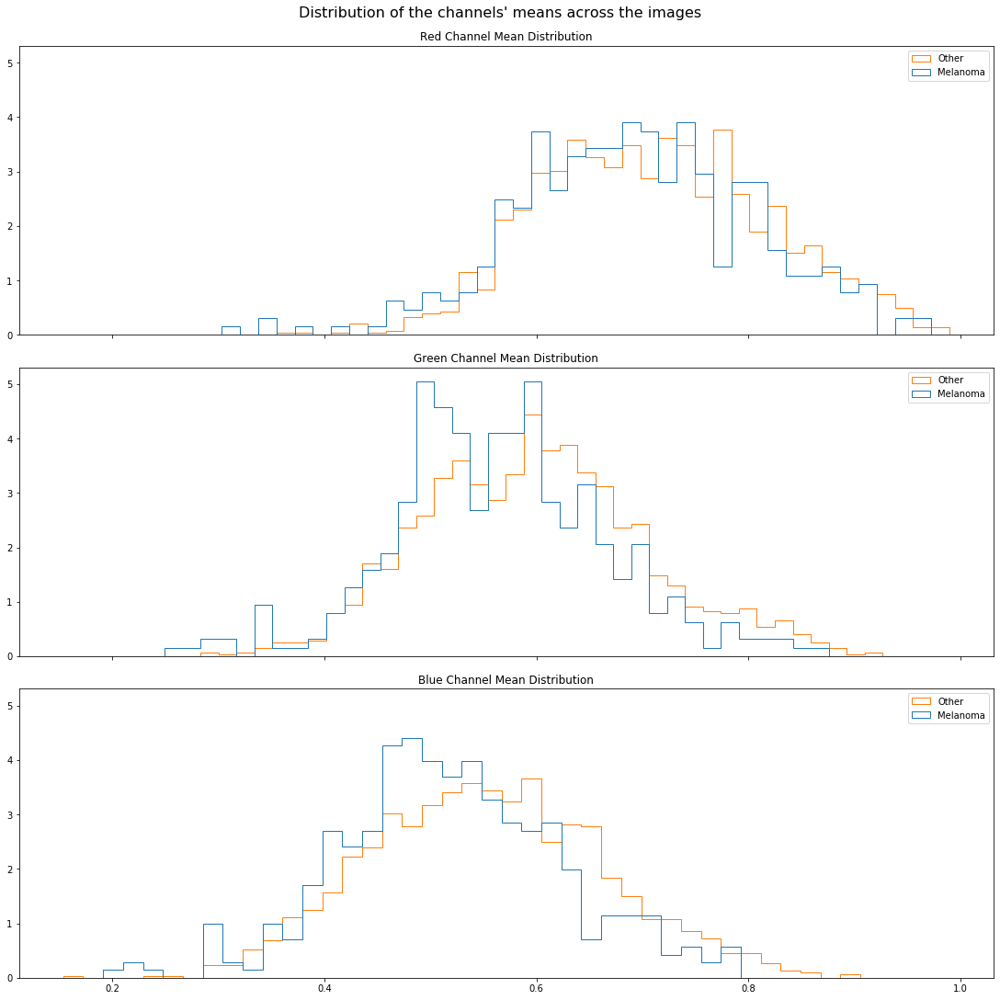

In [8]:
fig, axs = plt.subplots(3, 1, sharex=True, sharey=True,constrained_layout=True, figsize=(15,15))

names = ['Melanoma',"Other"]

for idx,data_point in enumerate(zip([mel_mean_reds, mel_mean_greens, mel_mean_blues],
                                    [other_mean_reds, other_mean_greens, other_mean_blues],
                                    ['Red','Green','Blue'])):
    melanoma, other, channel_name = data_point
    fig.suptitle('Distribution of the channels\' means across the images',fontsize=16)
    axs[idx].hist([melanoma,other],bins=40,histtype='step',density=True,label=names)
    axs[idx].set_title(f'{channel_name} Channel Mean Distribution')
    axs[idx].legend()



## Si aplicamos Max RGB

In [9]:
def calculate_color_constancy_distributions(gamma): 
    max_rgb_channels_mean = partial(get_list_of_channels_mean_for_list_of_image_paths, transforms=[correct_color_max_rgb(gamma=gamma)])

    max_rgb_mel_mean_reds, max_rgb_mel_mean_greens, max_rgb_mel_mean_blues = max_rgb_channels_mean(mel_imgs_paths)

    max_rgb_other_mean_reds, max_rgb_other_mean_greens, max_rgb_other_mean_blues = max_rgb_channels_mean(other_imgs_paths)
    return {'mel': (max_rgb_mel_mean_reds, max_rgb_mel_mean_greens, max_rgb_mel_mean_blues),
           'other': (max_rgb_other_mean_reds, max_rgb_other_mean_greens, max_rgb_other_mean_blues) }


def plot_color_constancy_distributions(gamma):
    means = calculate_color_constancy_distributions(gamma)

    max_rgb_mel_mean_reds, max_rgb_mel_mean_greens, max_rgb_mel_mean_blues = means['mel']

    max_rgb_other_mean_reds, max_rgb_other_mean_greens, max_rgb_other_mean_blues = means['other']


    fig, axs = plt.subplots(3, 1, sharex=True, sharey=True,constrained_layout=True, figsize=(15,15))

    names = ['Melanoma',"Other"]

    for idx,data_point in enumerate(zip([max_rgb_mel_mean_reds, max_rgb_mel_mean_greens, max_rgb_mel_mean_blues],
                                        [max_rgb_other_mean_reds, max_rgb_other_mean_greens, max_rgb_other_mean_blues],
                                        ['Red','Green','Blue'])):
        melanoma, other, channel_name = data_point
        fig.suptitle(f'Distribution of the channels\' means across the images when MAX RGB is applied',fontsize=16)
        axs[idx].hist([melanoma,other],bins=40,histtype='step',density=True,label=names)
        axs[idx].set_title(f'{channel_name} Channel Mean Distribution')
        axs[idx].legend()

In [10]:
interact(plot_color_constancy_distributions, gamma=widgets.FloatSlider(min=1/2.2, max=2.2,step=.01,    continuous_update=False
))

interactive(children=(FloatSlider(value=0.45454545454545453, continuous_update=False, description='gamma', max…

<function __main__.plot_color_constancy_distributions(gamma)>

## Comparando

In [13]:
def plot_comparison_with_and_without_color_constancy(gamma):
    means = calculate_color_constancy_distributions(gamma)

    max_rgb_mel_mean_reds, max_rgb_mel_mean_greens, max_rgb_mel_mean_blues = means['mel']

    max_rgb_other_mean_reds, max_rgb_other_mean_greens, max_rgb_other_mean_blues = means['other']


    baseline_reds = mel_mean_reds + other_mean_reds
    baseline_greens = mel_mean_greens + other_mean_greens
    baseline_blues = mel_mean_blues + other_mean_blues


    max_rgb_reds = max_rgb_mel_mean_reds + max_rgb_other_mean_reds
    max_rgb_greens = max_rgb_mel_mean_greens + max_rgb_other_mean_greens
    max_rgb_blues = max_rgb_mel_mean_blues + max_rgb_other_mean_blues


    

    img = open_image(train_imgs.ls()[0])
    img.show()
    img.apply_tfms(correct_color_max_rgb(gamma=gamma)).show()
    
    

    fig, axs = plt.subplots(3, 1, sharex=True, sharey=True,constrained_layout=True, figsize=(15,15))

    names = ['Baseline',"Max RGB"]

    for idx,data_point in enumerate(zip([baseline_reds, baseline_greens, baseline_blues],
                                        [max_rgb_reds, max_rgb_greens, max_rgb_blues],
                                        ['Red','Green','Blue'])):
        melanoma, other, channel_name = data_point
        fig.suptitle('Comparing distributions with and without the effect of Max RGB',fontsize=16)
        axs[idx].hist([melanoma,other],bins=40,histtype='step',density=True,label=names)
        axs[idx].set_title(f'{channel_name} Channel Mean Distribution')
        axs[idx].legend()
    
    
    

In [14]:
interact(plot_comparison_with_and_without_color_constancy, gamma=widgets.FloatSlider(min=1/2.2, max=2.2,step=.01,    continuous_update=False
))

interactive(children=(FloatSlider(value=0.45454545454545453, continuous_update=False, description='gamma', max…

<function __main__.plot_comparison_with_and_without_color_constancy(gamma)>

# Takeaway

Utilizar un gamma de valor 1/2.2 parece reducir la varianza en la media de los canales de las imágenes

# Training a Model

In [4]:
'Número Imágenes de entrenamiento:', len(dm.get_dataset_path('train_images').ls())

('Número Imágenes de entrenamiento:', 2000)

In [5]:
'Número Imágenes de validación:', len(dm.get_dataset_path('valid_images').ls())

('Número Imágenes de validación:', 150)

In [8]:
# https://forums.fast.ai/t/error-data-show-batch-runtimeerror-expected-object-of-scalar-type-float-but-got-scalar-type-double-for-argument-3-mat2-in-call-to-th-addmm-out/70102/8
# !pip uninstall torch torchvision -y
# !pip install torch==1.4.0 torchvision==0.5.0

In [6]:
from skimage import color

In [7]:
def reload_dataset(dm,segmented=False, seed=1):
    random_seed(seed,True)
    tfms = get_transforms(flip_vert=True, max_rotate=180,max_zoom=1.3, max_lighting=0.3,p_affine=1, max_warp=0)
#     tfms = [[],[]]
    data = ImageList.from_folder(dm.get_dataset_path('train_images').parent)\
    .split_by_folder(train=dm.get_dataset_path('train_images').name + ('_segmented' if segmented else ''),
                   valid=dm.get_dataset_path('valid_images').name +('_segmented' if segmented else ''))\
    .label_from_func(dm.get_label_for_image_path)\
    .transform(tfms,size=224)\
    .databunch(bs=16)\
    .normalize(imagenet_stats)
    return data

data = reload_dataset(dm)

In [9]:
Path('ben_2017_train_images_resized_to_224_picked_all_training_for_2017/').parent

PosixPath('.')

In [8]:
def reload_dataset_ben(dm,segmented=False, seed=1):
    random_seed(seed,True)
    tfms = get_transforms(flip_vert=True, max_rotate=180,max_zoom=1.3, max_lighting=0.0,p_affine=1, max_warp=0)
    data = ImageList.from_folder(Path('ben_2017_train_images_resized_to_224_picked_all_training_for_2017/').parent)\
    .split_by_folder(train=Path('ben_2017_train_images_resized_to_224_picked_all_training_for_2017/').name + ('_segmented' if segmented else ''),
                   valid=Path('ben_2017_valid_images_resized_to_224_picked_all_training_for_2017/').name +('_segmented' if segmented else ''))\
    .label_from_func(dm.get_label_for_image_path)\
    .transform(tfms,size=224)\
    .databunch(bs=16)\
    .normalize(imagenet_stats)
    return data

data = reload_dataset_ben(dm)

In [9]:
train_count,valid_count = pd.value_counts(data.train_ds.y.items),pd.value_counts(data.valid_ds.y.items)
train_count.index,valid_count.index = [data.classes[i] for i in train_count.index],[data.classes[i] for i in valid_count.index]

print('train_count: \n',train_count,'\n\n','valid_count: \n', valid_count)
print('ratios:')
print(valid_count / train_count, '%')

train_count: 
 seborrheic_keratosis_or_nevus    1626
melanoma                          374
dtype: int64 

 valid_count: 
 seborrheic_keratosis_or_nevus    120
melanoma                          30
dtype: int64
ratios:
seborrheic_keratosis_or_nevus    0.073801
melanoma                         0.080214
dtype: float64 %


## Show color correction changes

### Baseline

In [41]:
data = reload_dataset(dm)

In [42]:
def browse_images(image_index): 
    data.train_ds[image_index][0].show()
    
    
interact(browse_images, image_index=widgets.FloatSlider(min=0, max=len(data.train_ds),step=1, continuous_update=False
))

interactive(children=(FloatSlider(value=0.0, continuous_update=False, description='image_index', max=2000.0, s…

<function __main__.browse_images(image_index)>

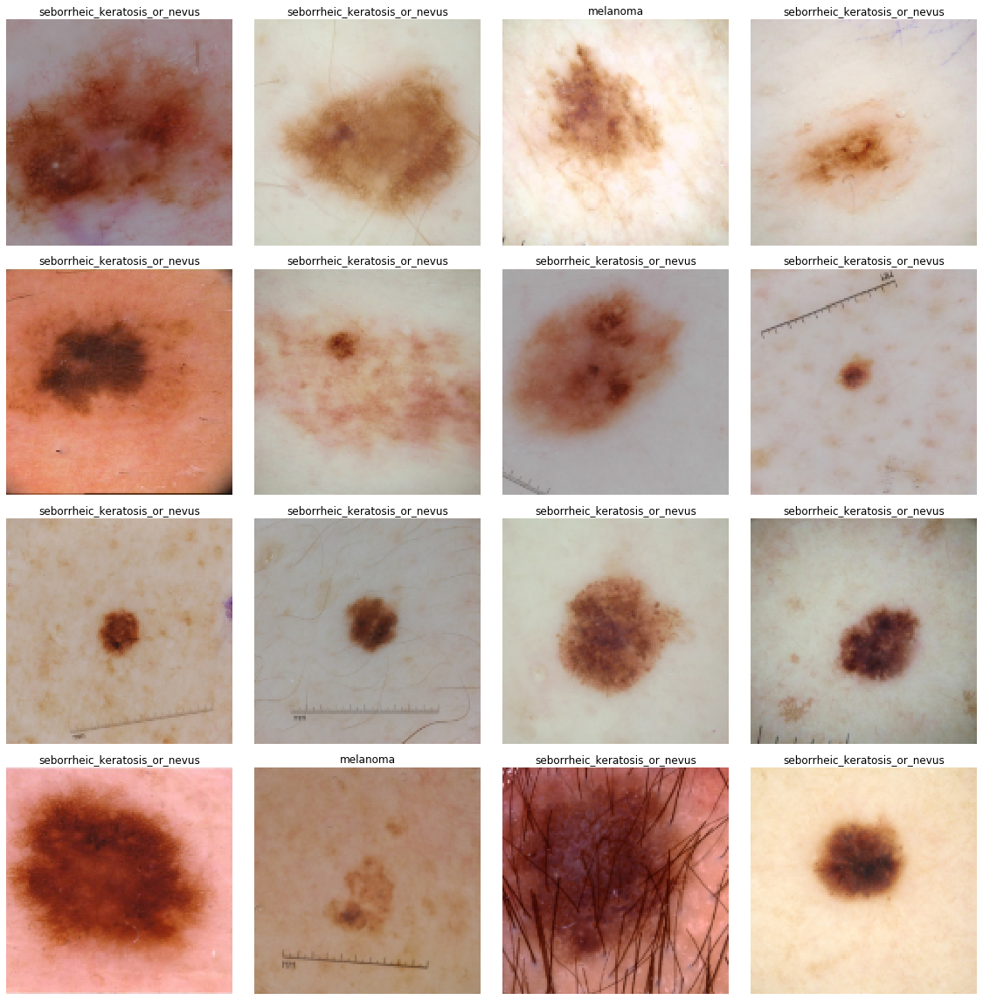

In [29]:
random_seed(1,True)
data.show_batch()

In [10]:
data.items[4]

PosixPath('2017_train_images_resized_to_224_picked_all_training_for_2017/ISIC_0012673.jpg')

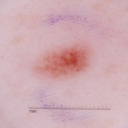

In [115]:
random_seed(1,True)
data.train_ds[4][0]

In [ ]:
filter(lambda x: x[1] !)

In [11]:
%psource plot_multi

In [17]:
def aux_plot(i,j,ax,img_index): 
    data.train_ds[img_index][0].show(ax=ax)

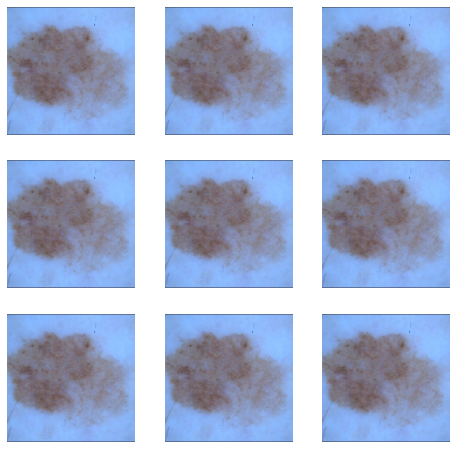

In [18]:
plot_multi(partial(aux_plot,img_index=1), 3, 3, figsize=(8,8))

### Max rgb

In [10]:
def add_max_rgb(data):
    color_constancy_tfm = correct_color_max_rgb(gamma=2.2, order=0)
    data.train_ds.tfms.insert(0,color_constancy_tfm);
    data.valid_ds.tfms.insert(0,color_constancy_tfm);

In [14]:
data = reload_dataset(dm)
add_max_rgb(data)

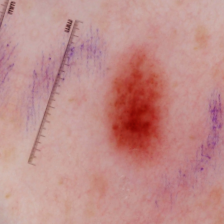

In [15]:
data.train_ds[4][0]

In [16]:
# sorted(data.train_ds.tfms, key=lambda x: x.order)

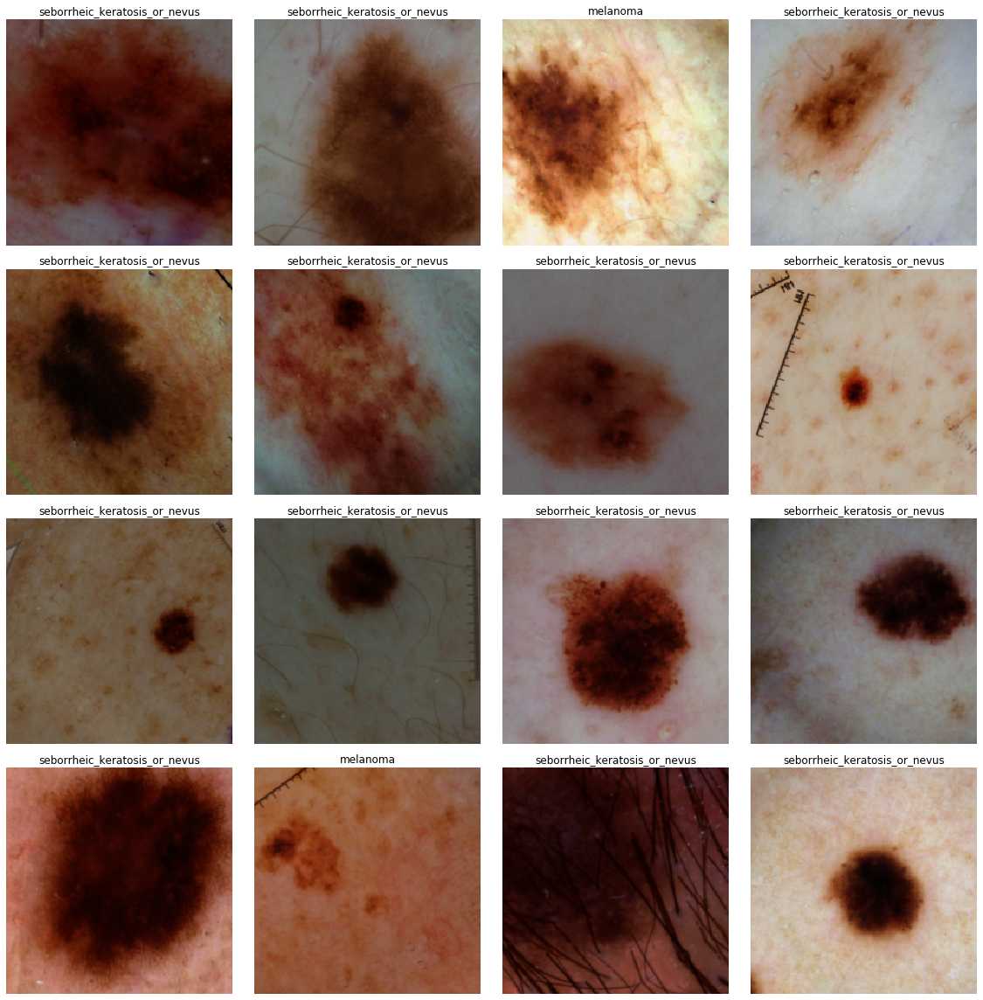

In [17]:
random_seed(1,True)
data.show_batch()

### Shades of Gray

In [11]:
def add_shades_of_gray(data):
    color_constancy_tfm = correct_color_shades_of_gray(gamma=2.2, order=0,p=6)
    data.train_ds.tfms.insert(0,color_constancy_tfm);
    data.valid_ds.tfms.insert(0,color_constancy_tfm);

In [12]:
data = reload_dataset(dm)
add_shades_of_gray(data)

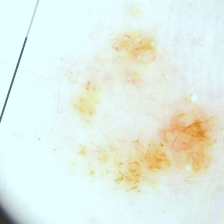

In [13]:
data.train_ds[2][0]

In [14]:
# sorted(data.train_ds.tfms, key=lambda x: x.order)

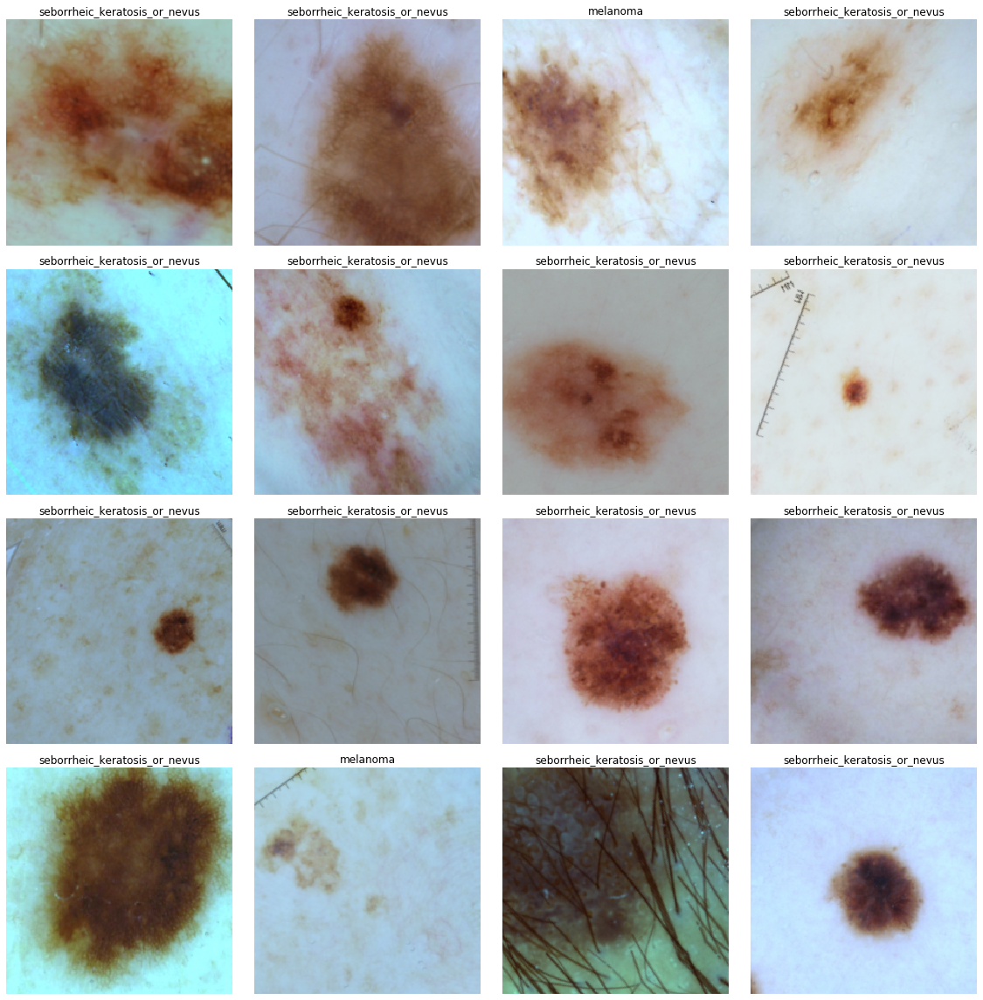

In [15]:
random_seed(1,True)
data.show_batch()

### Ben Graham

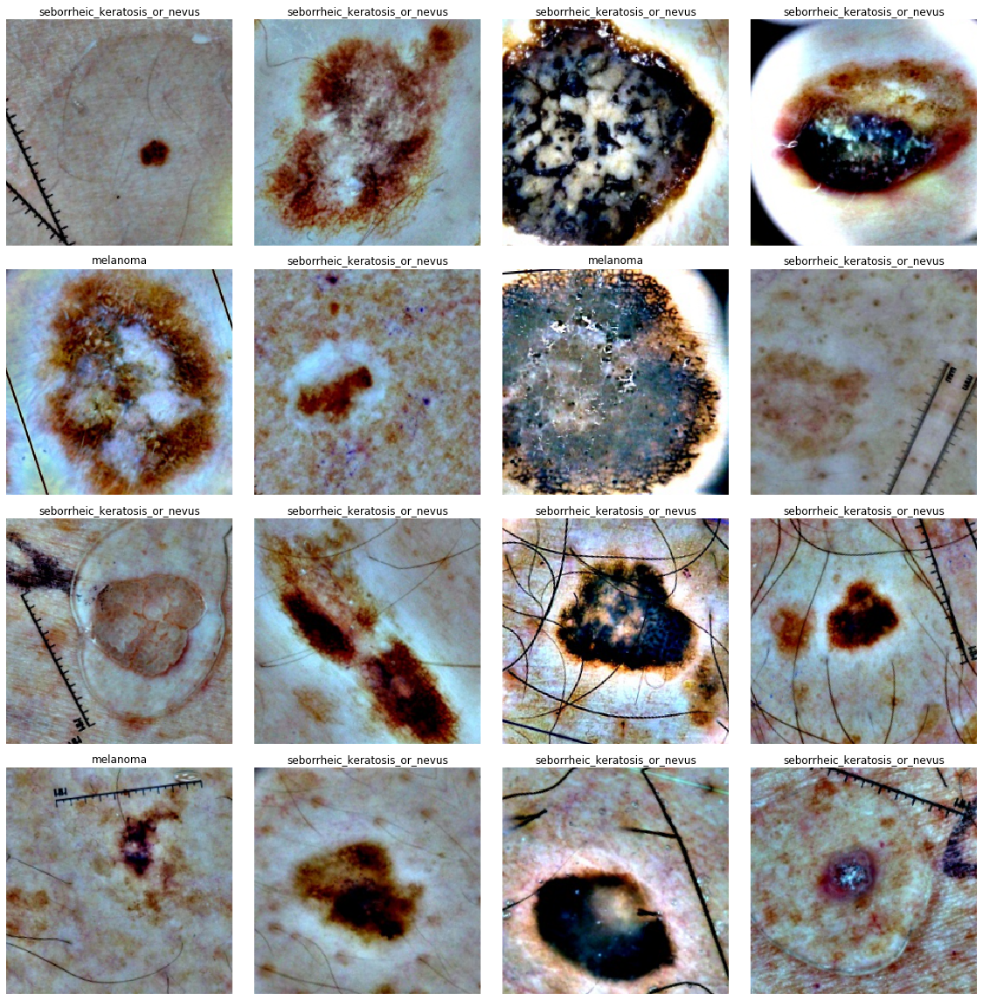

In [23]:
data = reload_dataset_ben(dm)
data.show_batch()

## Train

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.932951,0.520214,0.233333,0.766667,0.738333,00:15
1,0.633052,0.485307,0.213333,0.786667,0.722500,00:15
2,0.533406,0.443192,0.186667,0.813333,0.764167,00:15


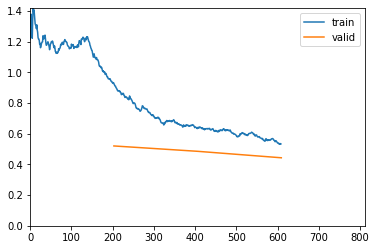

In [ ]:
learner = cnn_learner(data, models.resnet50, metrics=[error_rate,accuracy, AUROC()],
                        callback_fns=[ShowGraph, OverSamplingCallback], 
                        pretrained=True)
    
        
random_seed(1,True)
learner.fit_one_cycle(4,max_lr=slice(3e-3))

In [30]:
def train_and_return_metrics(data,seed,epochs):
    random_seed(seed,True)
    learner = cnn_learner(data, models.resnet50, metrics=[error_rate,accuracy, AUROC()],
                        callback_fns=[ShowGraph, OverSamplingCallback], 
                        pretrained=True)
    
        
    random_seed(seed,True)
    learner.fit_one_cycle(4,max_lr=slice(3e-3))
    accuracies = list(map(lambda x: x[1], learner.recorder.metrics))
    
    #Unfreeze
    learner.unfreeze()
    learner.fit_one_cycle(epochs, max_lr=slice(3e-4))
    
    accuracies += list(map(lambda x: x[1], learner.recorder.metrics))


    return accuracies

## Train Baseline

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,1.046461,0.817731,0.286667,0.713333,0.658611,00:09
1,0.619178,0.643096,0.240000,0.760000,0.626111,00:06
2,0.510035,0.483138,0.200000,0.800000,0.750556,00:06
3,0.456716,0.429583,0.173333,0.826667,0.788333,00:06


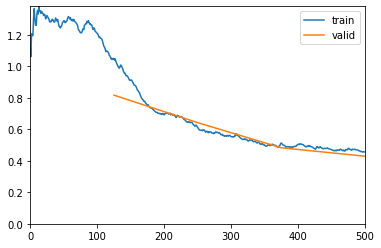

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.234623,0.409247,0.166667,0.833333,0.812222,00:12
1,0.143083,0.413527,0.173333,0.826667,0.837778,00:12
2,0.092059,0.509697,0.193333,0.806667,0.763889,00:12
3,0.388996,0.428175,0.193333,0.806667,0.826111,00:12
4,0.413347,0.428077,0.186667,0.813333,0.806944,00:12
5,0.402752,0.447563,0.200000,0.800000,0.786944,00:12
6,0.409065,0.451293,0.186667,0.813333,0.764444,00:13
7,0.388473,0.458793,0.180000,0.820000,0.753056,00:13
8,0.394780,0.481590,0.180000,0.820000,0.756389,00:13
9,0.384629,0.427067,0.180000,0.820000,0.788889,00:13


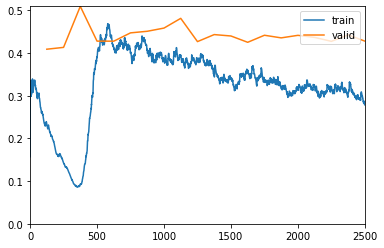

[tensor(0.7133),
 tensor(0.7600),
 tensor(0.8000),
 tensor(0.8267),
 tensor(0.8333),
 tensor(0.8267),
 tensor(0.8067),
 tensor(0.8067),
 tensor(0.8133),
 tensor(0.8000),
 tensor(0.8133),
 tensor(0.8200),
 tensor(0.8200),
 tensor(0.8200),
 tensor(0.8067),
 tensor(0.8400),
 tensor(0.8333),
 tensor(0.8400),
 tensor(0.8333),
 tensor(0.8467),
 tensor(0.8400),
 tensor(0.8400),
 tensor(0.8267),
 tensor(0.8467)]

In [46]:
data = reload_dataset(dm)
train_and_return_metrics(data,1,20)

## Train max rgb

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,1.038881,0.700760,0.246667,0.753333,0.686944,00:07
1,0.653246,0.522411,0.193333,0.806667,0.663889,00:07
2,0.513633,0.547628,0.173333,0.826667,0.675833,00:07
3,0.455478,0.470628,0.160000,0.840000,0.755278,00:06


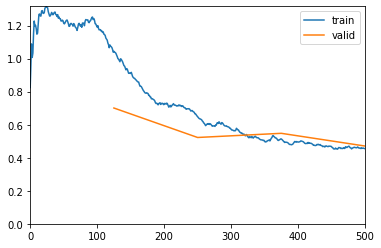

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.212832,0.468425,0.166667,0.833333,0.738889,00:12
1,0.140535,0.490987,0.166667,0.833333,0.762222,00:12
2,0.087390,0.588076,0.180000,0.820000,0.693611,00:12
3,0.395423,0.512846,0.186667,0.813333,0.741111,00:12
4,0.435234,0.464010,0.166667,0.833333,0.777500,00:12
5,0.440606,0.490116,0.166667,0.833333,0.766667,00:12
6,0.423742,0.439721,0.160000,0.840000,0.789722,00:14
7,0.395830,0.439342,0.166667,0.833333,0.757778,00:15
8,0.417526,0.480588,0.180000,0.820000,0.768056,00:13
9,0.383158,0.424007,0.180000,0.820000,0.799722,00:13


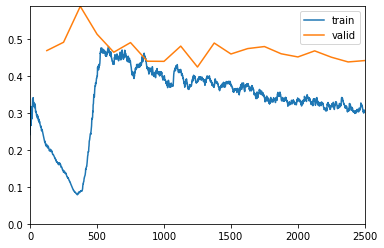

[tensor(0.7533),
 tensor(0.8067),
 tensor(0.8267),
 tensor(0.8400),
 tensor(0.8333),
 tensor(0.8333),
 tensor(0.8200),
 tensor(0.8133),
 tensor(0.8333),
 tensor(0.8333),
 tensor(0.8400),
 tensor(0.8333),
 tensor(0.8200),
 tensor(0.8200),
 tensor(0.8133),
 tensor(0.8267),
 tensor(0.8267),
 tensor(0.8400),
 tensor(0.8267),
 tensor(0.8267),
 tensor(0.8200),
 tensor(0.8333),
 tensor(0.8333),
 tensor(0.8267)]

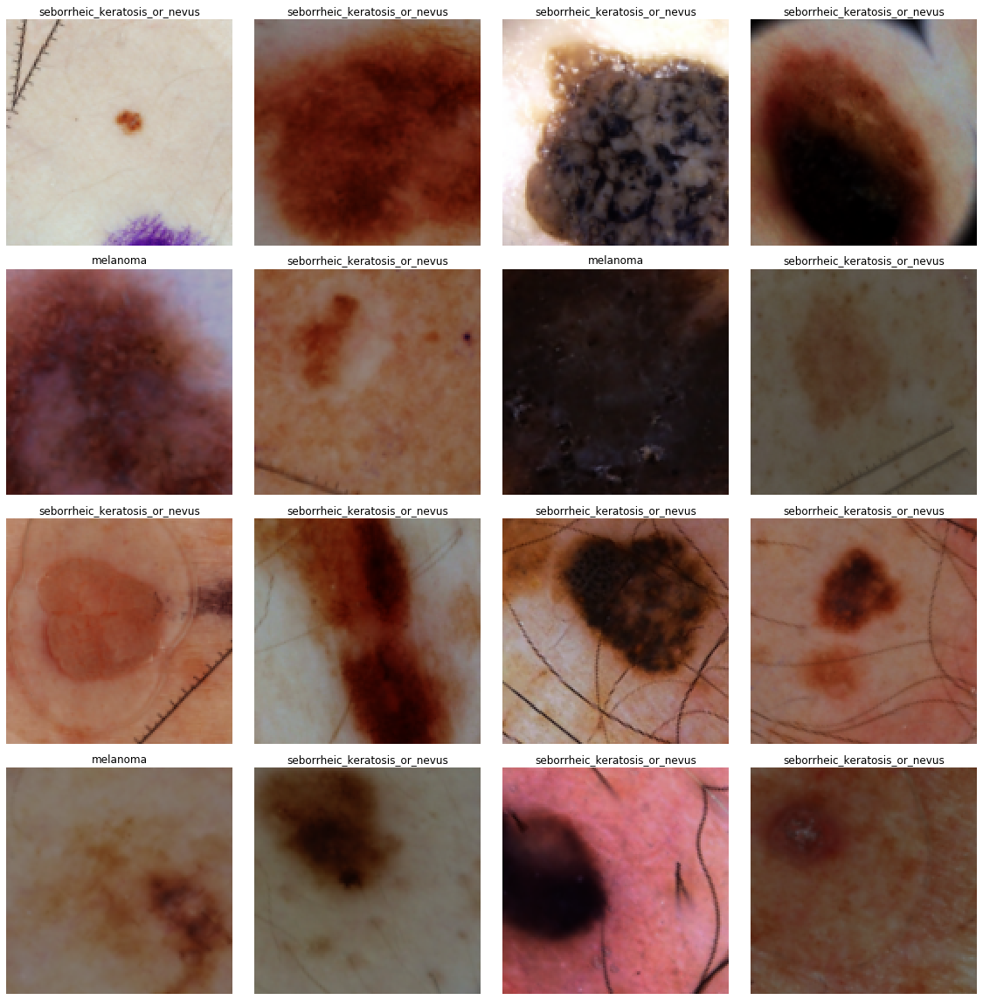

In [53]:
data = reload_dataset(dm)
add_max_rgb(data)
data.show_batch()
train_and_return_metrics(data,1,20)

## Train Shades of Gray

In [ ]:
data = reload_dataset(dm)
add_shades_of_gray(data)
train_and_return_metrics(data,1,20)

# Comparison for various seeds

In [31]:
results_file_name = 'results/color_ben_analysis_seed'
# columns = ['Baseline','Max RGB','Shades of Gray']
columns = ['Baseline','Max RGB','Shades of Gray', 'Ben Graham']

In [32]:
def write_results(seed,*args):
    f = open(f'{results_file_name}_{seed}.txt','w+')
    f.write(','.join(columns) + '\n')
    
    for epoch in zip(*args):
        line = ''
        for idx, variant in enumerate(epoch):
            line += str(variant.item())
            if idx != (len(epoch) - 1): 
                line += ','
            else: 
                line += '\n'
        
        f.write(line)


    f.close()

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.906114,0.585666,0.273333,0.726667,0.716111,00:15
1,0.652457,0.442315,0.213333,0.786667,0.786667,00:15
2,0.560716,0.427107,0.186667,0.813333,0.783889,00:15
3,0.529794,0.408678,0.166667,0.833333,0.781667,00:15


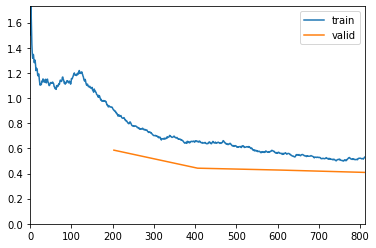

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.512989,0.405063,0.180000,0.820000,0.786389,00:22
1,0.477606,0.391462,0.160000,0.840000,0.815556,00:22
2,0.437320,0.378506,0.160000,0.840000,0.828333,00:22
3,0.414019,0.384338,0.160000,0.840000,0.854167,00:22
4,0.408447,0.403648,0.180000,0.820000,0.835000,00:22
5,0.362885,0.473528,0.186667,0.813333,0.842778,00:22
6,0.328233,0.454615,0.173333,0.826667,0.838333,00:22
7,0.293401,0.427894,0.173333,0.826667,0.842222,00:22
8,0.277986,0.471822,0.186667,0.813333,0.810556,00:22
9,0.209460,0.467239,0.173333,0.826667,0.870000,00:22


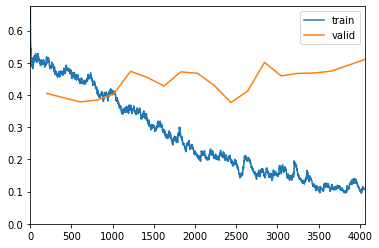

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.919791,0.589812,0.233333,0.766667,0.725278,00:15
1,0.648732,0.451514,0.226667,0.773333,0.779445,00:15
2,0.551848,0.417845,0.166667,0.833333,0.780833,00:15
3,0.545794,0.406389,0.173333,0.826667,0.786945,00:15


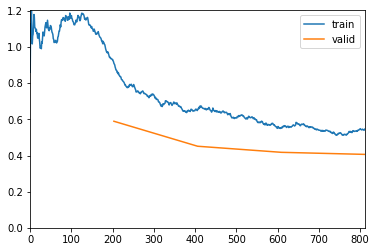

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.491933,0.398260,0.166667,0.833333,0.808056,00:23
1,0.473035,0.405970,0.173333,0.826667,0.801389,00:23
2,0.459434,0.389353,0.146667,0.853333,0.816111,00:23
3,0.406255,0.412428,0.180000,0.820000,0.816111,00:23
4,0.393781,0.404357,0.173333,0.826667,0.832778,00:23
5,0.382291,0.414830,0.173333,0.826667,0.826389,00:22
6,0.344910,0.464845,0.206667,0.793333,0.814444,00:23
7,0.272881,0.475346,0.153333,0.846667,0.845278,00:23
8,0.279371,0.416052,0.173333,0.826667,0.840556,00:23
9,0.230501,0.449119,0.193333,0.806667,0.846111,00:23


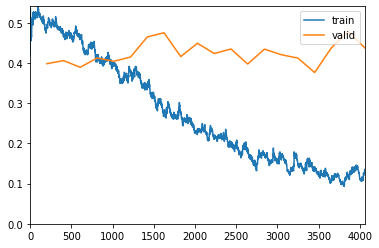

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.925639,0.507319,0.226667,0.773333,0.737222,00:15
1,0.626520,0.485176,0.226667,0.773333,0.722778,00:15
2,0.538266,0.456971,0.173333,0.826667,0.755000,00:15
3,0.539451,0.439703,0.226667,0.773333,0.756667,00:15


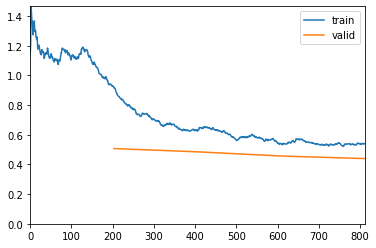

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.496524,0.433009,0.193333,0.806667,0.756945,00:23
1,0.463158,0.443917,0.166667,0.833333,0.773056,00:23
2,0.450087,0.463144,0.180000,0.820000,0.753611,00:23
3,0.411684,0.444184,0.186667,0.813333,0.791945,00:23
4,0.393468,0.451600,0.200000,0.800000,0.797778,00:23
5,0.370831,0.452443,0.200000,0.800000,0.831944,00:23
6,0.325074,0.511750,0.200000,0.800000,0.789722,00:23
7,0.303135,0.538265,0.193333,0.806667,0.788611,00:23
8,0.266704,0.437765,0.166667,0.833333,0.834167,00:23
9,0.235975,0.548044,0.193333,0.806667,0.802222,00:23


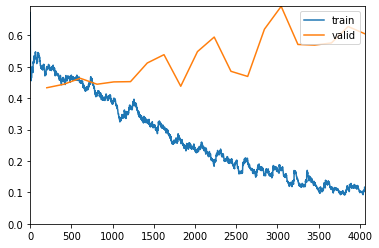

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.943185,0.545356,0.253333,0.746667,0.800000,00:15
1,0.656662,0.447564,0.186667,0.813333,0.792222,00:15
2,0.540971,0.427766,0.186667,0.813333,0.777778,00:15
3,0.515220,0.386043,0.146667,0.853333,0.821667,00:15


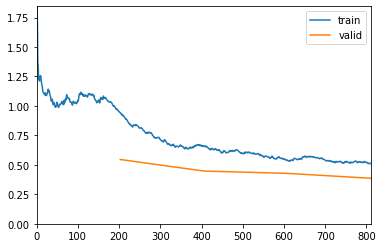

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.497573,0.387990,0.173333,0.826667,0.820556,00:22
1,0.473872,0.381074,0.153333,0.846667,0.812222,00:22
2,0.468412,0.392413,0.153333,0.846667,0.800000,00:22
3,0.415442,0.369318,0.153333,0.846667,0.856389,00:23
4,0.392050,0.436166,0.153333,0.846667,0.779306,00:22
5,0.346784,0.397579,0.180000,0.820000,0.823056,00:23
6,0.293328,0.419409,0.133333,0.866667,0.852778,00:22
7,0.267251,0.431822,0.166667,0.833333,0.911667,00:23
8,0.249246,0.347062,0.140000,0.860000,0.912500,00:22
9,0.194786,0.367440,0.140000,0.860000,0.890000,00:23


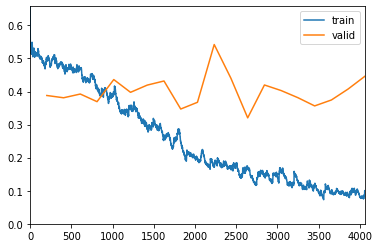

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.933152,0.592143,0.300000,0.700000,0.753611,00:15
1,0.644605,0.527278,0.246667,0.753333,0.683056,00:15
2,0.543904,0.470564,0.186667,0.813333,0.704444,00:15
3,0.523323,0.406186,0.166667,0.833333,0.779722,00:15


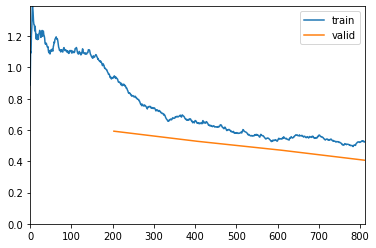

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.501063,0.421832,0.180000,0.820000,0.778889,00:23
1,0.464348,0.399800,0.180000,0.820000,0.810000,00:22
2,0.452880,0.398949,0.173333,0.826667,0.817222,00:23
3,0.427341,0.361151,0.140000,0.860000,0.843611,00:23
4,0.410753,0.383736,0.160000,0.840000,0.855278,00:23
5,0.357560,0.437194,0.166667,0.833333,0.849167,00:23
6,0.297039,0.397624,0.133333,0.866667,0.853333,00:23
7,0.308934,0.523254,0.173333,0.826667,0.830278,00:23
8,0.283315,0.528998,0.180000,0.820000,0.844722,00:23
9,0.221957,0.459598,0.133333,0.866667,0.865278,00:23


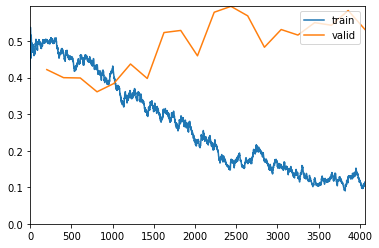

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.925539,0.754927,0.346667,0.653333,0.694722,00:15
1,0.639215,0.527550,0.253333,0.746667,0.742222,00:15
2,0.536324,0.437891,0.173333,0.826667,0.771389,00:15
3,0.514931,0.423955,0.166667,0.833333,0.784722,00:15


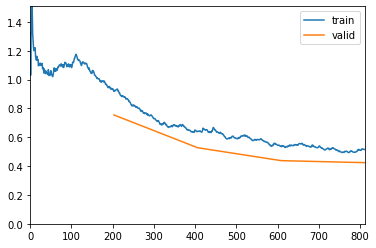

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.507638,0.428115,0.186667,0.813333,0.810000,00:23
1,0.475862,0.419538,0.193333,0.806667,0.800000,00:23
2,0.449128,0.401967,0.186667,0.813333,0.819722,00:23
3,0.452360,0.415426,0.186667,0.813333,0.814444,00:23
4,0.385013,0.458899,0.186667,0.813333,0.817778,00:23
5,0.357388,0.451280,0.180000,0.820000,0.809444,00:23
6,0.324306,0.520014,0.206667,0.793333,0.806111,00:23
7,0.310277,0.396387,0.146667,0.853333,0.867778,00:23
8,0.275189,0.414155,0.146667,0.853333,0.845833,00:23
9,0.208635,0.414971,0.153333,0.846667,0.881111,00:23


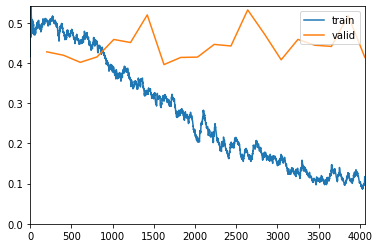

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.963554,0.660063,0.293333,0.706667,0.784722,00:15
1,0.638912,0.493513,0.233333,0.766667,0.772222,00:15
2,0.550060,0.453039,0.193333,0.806667,0.737222,00:15
3,0.489259,0.408291,0.160000,0.840000,0.786944,00:15


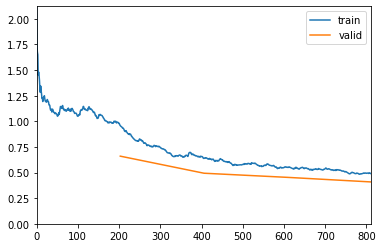

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.494253,0.434871,0.200000,0.800000,0.774444,00:23
1,0.447834,0.421536,0.173333,0.826667,0.788333,00:23
2,0.461215,0.407933,0.173333,0.826667,0.794445,00:23
3,0.451824,0.453304,0.173333,0.826667,0.788055,00:23
4,0.389668,0.421617,0.200000,0.800000,0.821389,00:23
5,0.377039,0.453816,0.200000,0.800000,0.808333,00:23
6,0.308077,0.454133,0.193333,0.806667,0.815556,00:23
7,0.304018,0.425537,0.140000,0.860000,0.860833,00:23
8,0.278033,0.439212,0.140000,0.860000,0.833889,00:23
9,0.232475,0.547491,0.206667,0.793333,0.813333,00:23


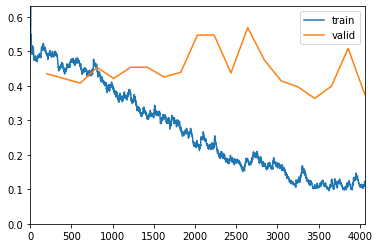

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.908563,0.935103,0.360000,0.640000,0.690000,00:15
1,0.635202,0.582850,0.246667,0.753333,0.765833,00:15
2,0.562229,0.463315,0.160000,0.840000,0.747500,00:15
3,0.508751,0.403752,0.126667,0.873333,0.798056,00:15


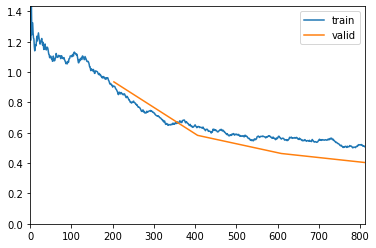

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.509647,0.414738,0.140000,0.860000,0.791945,00:23
1,0.466658,0.384197,0.140000,0.860000,0.798611,00:23
2,0.468191,0.414048,0.133333,0.866667,0.802222,00:22
3,0.431986,0.409736,0.153333,0.846667,0.805833,00:23
4,0.381364,0.446738,0.173333,0.826667,0.778333,00:23
5,0.344969,0.390039,0.133333,0.866667,0.830000,00:23
6,0.278768,0.378219,0.160000,0.840000,0.865278,00:23
7,0.294919,0.348185,0.120000,0.880000,0.881111,00:23
8,0.238526,0.595198,0.180000,0.820000,0.848889,00:23
9,0.212111,0.408116,0.160000,0.840000,0.871944,00:23


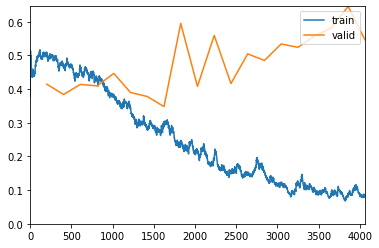

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.909745,0.629041,0.273333,0.726667,0.722778,00:15
1,0.619674,0.432617,0.200000,0.800000,0.836111,00:15
2,0.532145,0.414212,0.206667,0.793333,0.805833,00:15
3,0.493811,0.378703,0.180000,0.820000,0.826111,00:15


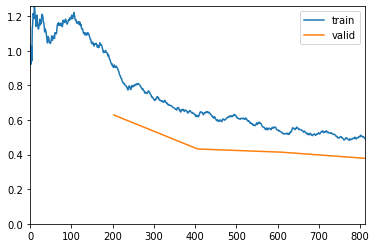

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.513727,0.385282,0.180000,0.820000,0.821944,00:23
1,0.460163,0.390340,0.166667,0.833333,0.817500,00:23
2,0.469332,0.383705,0.160000,0.840000,0.826111,00:23
3,0.415426,0.401885,0.186667,0.813333,0.828889,00:23
4,0.399720,0.423405,0.180000,0.820000,0.832222,00:23
5,0.371713,0.398986,0.160000,0.840000,0.845833,00:23
6,0.344113,0.493865,0.193333,0.806667,0.801944,00:23
7,0.289683,0.494208,0.153333,0.846667,0.846111,00:23
8,0.284847,0.570958,0.153333,0.846667,0.827500,00:23
9,0.249115,0.503189,0.160000,0.840000,0.842778,00:23


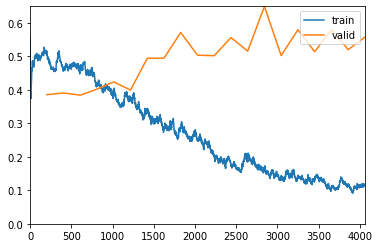

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.908970,0.611327,0.246667,0.753333,0.761944,00:15
1,0.650895,0.474612,0.220000,0.780000,0.809167,00:15
2,0.570062,0.416777,0.180000,0.820000,0.785833,00:15
3,0.495715,0.398510,0.140000,0.860000,0.787500,00:15


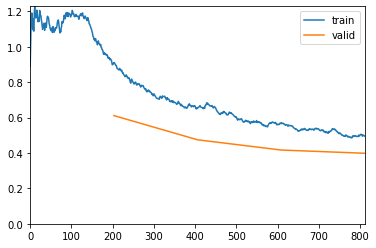

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.510858,0.423807,0.186667,0.813333,0.790278,00:23
1,0.479339,0.393187,0.166667,0.833333,0.824722,00:23
2,0.428549,0.391859,0.153333,0.846667,0.817222,00:23
3,0.427564,0.334086,0.133333,0.866667,0.879166,00:23
4,0.392746,0.392033,0.160000,0.840000,0.854444,00:23
5,0.353036,0.390563,0.146667,0.853333,0.853333,00:23
6,0.325040,0.403537,0.173333,0.826667,0.853611,00:23
7,0.292448,0.377458,0.160000,0.840000,0.864166,00:23
8,0.271408,0.493823,0.160000,0.840000,0.834722,00:23
9,0.236569,0.425534,0.153333,0.846667,0.866944,00:23


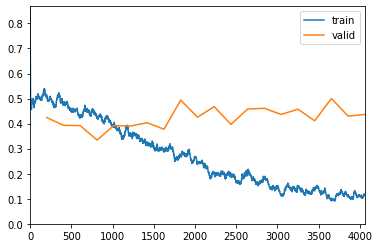

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.885695,0.637049,0.346667,0.653333,0.741667,00:15
1,0.644954,0.596407,0.273333,0.726667,0.768889,00:15
2,0.539639,0.457085,0.146667,0.853333,0.737778,00:15
3,0.475174,0.408915,0.160000,0.840000,0.765833,00:15


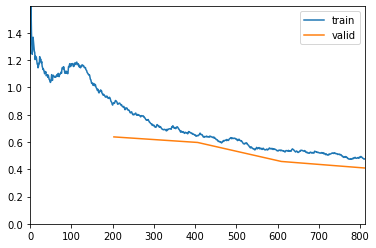

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.494178,0.417879,0.180000,0.820000,0.767778,00:23
1,0.455173,0.412893,0.180000,0.820000,0.785833,00:23
2,0.430231,0.413660,0.166667,0.833333,0.780833,00:23
3,0.413166,0.433990,0.160000,0.840000,0.784722,00:23
4,0.378824,0.438135,0.166667,0.833333,0.800556,00:23
5,0.336132,0.478495,0.180000,0.820000,0.799722,00:23
6,0.318674,0.497713,0.180000,0.820000,0.838055,00:23
7,0.286598,0.501613,0.166667,0.833333,0.831667,00:23
8,0.269999,0.575953,0.180000,0.820000,0.828889,00:23
9,0.226343,0.562823,0.153333,0.846667,0.825000,00:23


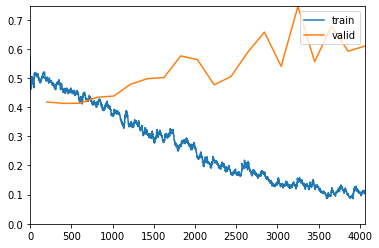

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.893707,0.634409,0.286667,0.713333,0.755278,00:15
1,0.653675,0.417057,0.166667,0.833333,0.777222,00:15
2,0.546012,0.401245,0.173333,0.826667,0.805556,00:15
3,0.498468,0.385280,0.180000,0.820000,0.816389,00:15


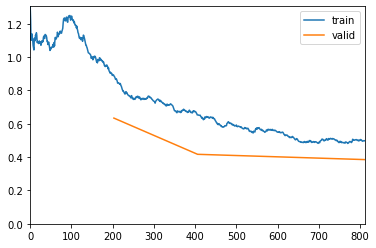

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.492449,0.383905,0.173333,0.826667,0.821667,00:23
1,0.460924,0.363591,0.146667,0.853333,0.835833,00:23
2,0.431991,0.410997,0.173333,0.826667,0.810000,00:23
3,0.393052,0.417647,0.180000,0.820000,0.819167,00:23
4,0.365873,0.335091,0.160000,0.840000,0.885278,00:23
5,0.319665,0.346503,0.146667,0.853333,0.884722,00:22
6,0.303585,0.377981,0.153333,0.846667,0.862500,00:23
7,0.283586,0.375810,0.146667,0.853333,0.885000,00:22
8,0.245394,0.438143,0.140000,0.860000,0.885833,00:23
9,0.212194,0.405238,0.126667,0.873333,0.874445,00:23


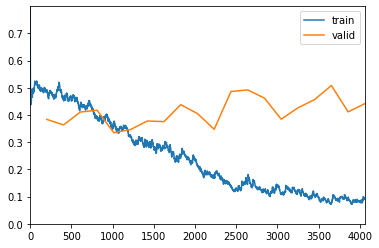

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.905364,0.571694,0.273333,0.726667,0.739445,00:15
1,0.662945,0.497067,0.180000,0.820000,0.719445,00:15
2,0.563533,0.460886,0.206667,0.793333,0.747500,00:15
3,0.504465,0.426970,0.173333,0.826667,0.770556,00:15


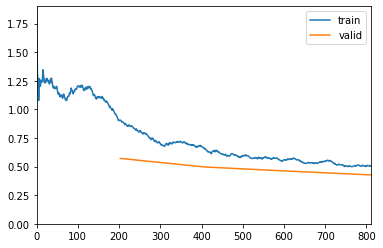

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.489094,0.420589,0.160000,0.840000,0.763889,00:23
1,0.504239,0.422741,0.146667,0.853333,0.778611,00:23
2,0.456587,0.424783,0.186667,0.813333,0.789445,00:23
3,0.417593,0.404845,0.166667,0.833333,0.834722,00:23
4,0.411200,0.402331,0.193333,0.806667,0.833333,00:23
5,0.363207,0.413958,0.186667,0.813333,0.837778,00:23
6,0.328646,0.429667,0.180000,0.820000,0.846944,00:23
7,0.279533,0.522841,0.173333,0.826667,0.811111,00:23
8,0.253260,0.475010,0.180000,0.820000,0.830556,00:23
9,0.231204,0.455970,0.180000,0.820000,0.844444,00:23


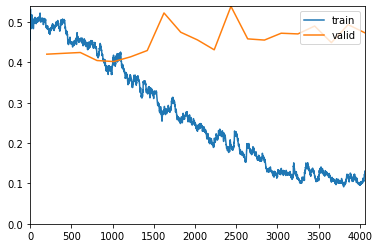

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.922998,0.553733,0.233333,0.766667,0.756667,00:15
1,0.665581,0.548227,0.226667,0.773333,0.651667,00:15
2,0.552148,0.437897,0.193333,0.806667,0.799722,00:15
3,0.532369,0.403976,0.166667,0.833333,0.817222,00:15


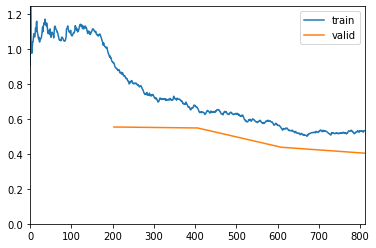

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.503770,0.396487,0.180000,0.820000,0.814167,00:23
1,0.490603,0.399752,0.146667,0.853333,0.804722,00:23
2,0.425412,0.407125,0.173333,0.826667,0.812500,00:23
3,0.431650,0.387777,0.146667,0.853333,0.837500,00:23
4,0.394779,0.446962,0.166667,0.833333,0.812500,00:23
5,0.375862,0.478639,0.160000,0.840000,0.796667,00:23
6,0.346157,0.435808,0.153333,0.846667,0.834167,00:23
7,0.280525,0.479140,0.173333,0.826667,0.816389,00:23
8,0.277915,0.431876,0.146667,0.853333,0.841944,00:23
9,0.225667,0.535301,0.160000,0.840000,0.832778,00:23


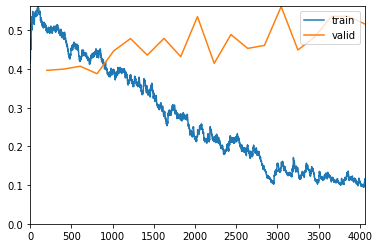

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.917521,0.598748,0.246667,0.753333,0.675000,00:15
1,0.640004,0.490135,0.226667,0.773333,0.728611,00:15
2,0.543628,0.467919,0.206667,0.793333,0.766944,00:15
3,0.525102,0.429805,0.173333,0.826667,0.785556,00:15


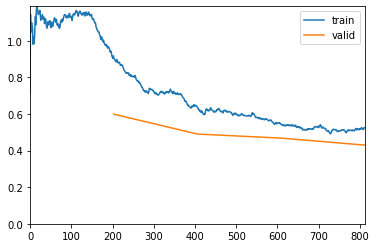

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.494685,0.429403,0.186667,0.813333,0.780278,00:23
1,0.467056,0.429821,0.186667,0.813333,0.790556,00:23
2,0.431171,0.437289,0.213333,0.786667,0.798333,00:23
3,0.421752,0.413623,0.173333,0.826667,0.822222,00:23
4,0.412750,0.442571,0.206667,0.793333,0.802222,00:23
5,0.361712,0.548079,0.220000,0.780000,0.797778,00:23
6,0.325078,0.422553,0.173333,0.826667,0.834722,00:23
7,0.278932,0.466732,0.166667,0.833333,0.843889,00:23
8,0.268575,0.418194,0.173333,0.826667,0.861944,00:23
9,0.244986,0.502909,0.160000,0.840000,0.860833,00:23


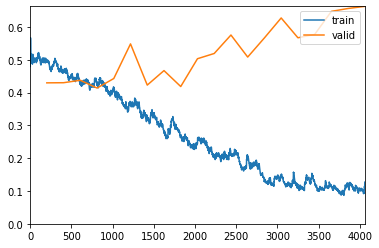

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.917223,0.539392,0.213333,0.786667,0.776945,00:15
1,0.656781,0.438311,0.200000,0.800000,0.769722,00:15
2,0.527769,0.441109,0.186667,0.813333,0.784445,00:15
3,0.502819,0.401894,0.173333,0.826667,0.816111,00:15


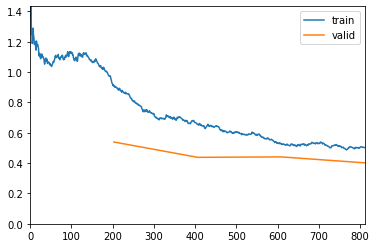

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.476861,0.396517,0.160000,0.840000,0.812222,00:23
1,0.484123,0.385765,0.146667,0.853333,0.807222,00:23
2,0.413726,0.372930,0.146667,0.853333,0.827500,00:23
3,0.431097,0.357541,0.133333,0.866667,0.841389,00:23
4,0.377057,0.376505,0.140000,0.860000,0.840556,00:23
5,0.330513,0.356455,0.140000,0.860000,0.872500,00:23
6,0.299927,0.377191,0.133333,0.866667,0.868889,00:23
7,0.250123,0.470411,0.200000,0.800000,0.814444,00:23
8,0.239984,0.404454,0.120000,0.880000,0.853056,00:23
9,0.211209,0.499336,0.140000,0.860000,0.868889,00:23


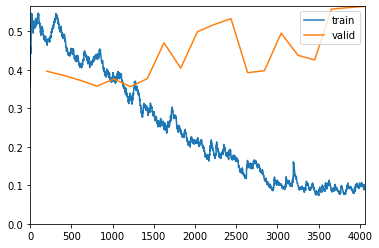

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.908836,0.552763,0.213333,0.786667,0.724167,00:15
1,0.625022,0.534686,0.206667,0.793333,0.678889,00:15
2,0.532655,0.468617,0.180000,0.820000,0.760833,00:15
3,0.512810,0.422462,0.173333,0.826667,0.770556,00:15


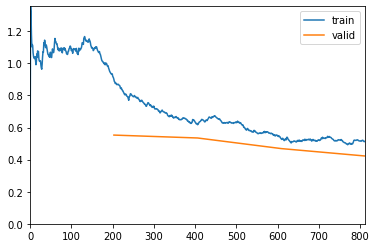

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.515430,0.400106,0.173333,0.826667,0.795000,00:23
1,0.484737,0.379209,0.186667,0.813333,0.826111,00:23
2,0.443657,0.360063,0.153333,0.846667,0.840833,00:23
3,0.417840,0.356682,0.166667,0.833333,0.857222,00:23
4,0.406916,0.370956,0.160000,0.840000,0.863056,00:23
5,0.364505,0.347084,0.133333,0.866667,0.893611,00:23
6,0.312453,0.476917,0.153333,0.846667,0.842500,00:23
7,0.289930,0.581863,0.153333,0.846667,0.820833,00:23
8,0.262779,0.465591,0.146667,0.853333,0.838889,00:23
9,0.218123,0.492072,0.180000,0.820000,0.871389,00:23


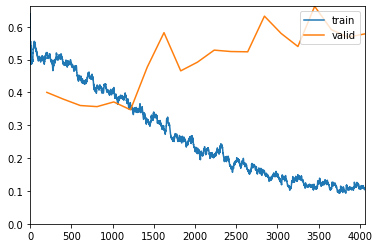

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.921532,0.540365,0.273333,0.726667,0.775000,00:15
1,0.644869,0.582179,0.260000,0.740000,0.753889,00:15
2,0.555362,0.446064,0.200000,0.800000,0.823056,00:15
3,0.536245,0.402616,0.180000,0.820000,0.829722,00:15


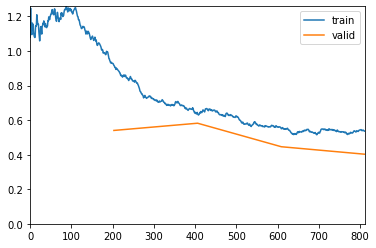

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.529617,0.368641,0.146667,0.853333,0.851944,00:23
1,0.489933,0.358996,0.166667,0.833333,0.858333,00:23
2,0.471470,0.397117,0.213333,0.786667,0.831944,00:23
3,0.422366,0.434601,0.233333,0.766667,0.830833,00:23
4,0.392562,0.354879,0.166667,0.833333,0.873055,00:23
5,0.376726,0.359906,0.146667,0.853333,0.862778,00:23
6,0.310212,0.428133,0.140000,0.860000,0.844167,00:23
7,0.301153,0.469660,0.166667,0.833333,0.807778,00:23
8,0.276408,0.445105,0.160000,0.840000,0.859444,00:23
9,0.230611,0.447811,0.153333,0.846667,0.858611,00:23


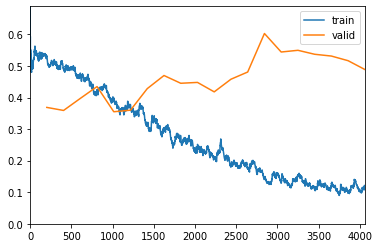

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.877717,0.630225,0.293333,0.706667,0.755556,00:15
1,0.646283,0.505408,0.206667,0.793333,0.732778,00:15
2,0.530057,0.427514,0.213333,0.786667,0.815556,00:15
3,0.521226,0.424346,0.193333,0.806667,0.807222,00:15


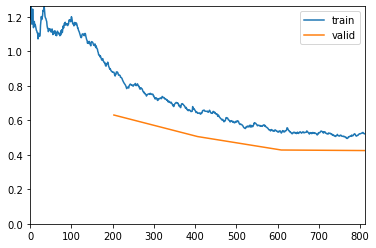

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.504009,0.407802,0.186667,0.813333,0.811667,00:23
1,0.465726,0.408848,0.186667,0.813333,0.803611,00:23
2,0.448521,0.468222,0.213333,0.786667,0.780278,00:23
3,0.406757,0.437416,0.160000,0.840000,0.806389,00:23
4,0.403369,0.432107,0.153333,0.846667,0.788333,00:23
5,0.364319,0.528730,0.193333,0.806667,0.768889,00:23
6,0.312901,0.534679,0.200000,0.800000,0.781389,00:23
7,0.279892,0.556362,0.193333,0.806667,0.785000,00:23
8,0.292943,0.517442,0.160000,0.840000,0.813611,00:23
9,0.212392,0.524585,0.193333,0.806667,0.804167,00:23


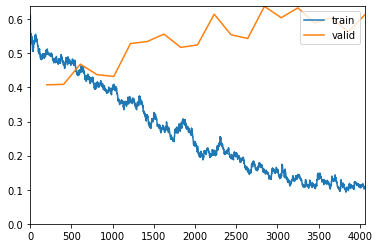

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.888409,0.690141,0.273333,0.726667,0.632500,00:15
1,0.662359,0.619918,0.260000,0.740000,0.652222,00:15
2,0.560079,0.436343,0.146667,0.853333,0.761111,00:15
3,0.499400,0.440260,0.193333,0.806667,0.781667,00:15


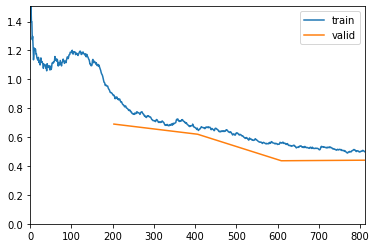

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.508795,0.396502,0.160000,0.840000,0.795000,00:23
1,0.481560,0.393891,0.146667,0.853333,0.798333,00:23
2,0.437223,0.386550,0.160000,0.840000,0.828611,00:23
3,0.371177,0.397353,0.173333,0.826667,0.833056,00:23
4,0.399429,0.402602,0.160000,0.840000,0.826389,00:23
5,0.349426,0.376625,0.133333,0.866667,0.855000,00:23
6,0.292304,0.474223,0.153333,0.846667,0.824722,00:23
7,0.265180,0.477502,0.133333,0.866667,0.850833,00:23
8,0.212351,0.433380,0.146667,0.853333,0.845833,00:23
9,0.202217,0.446275,0.106667,0.893333,0.833889,00:23


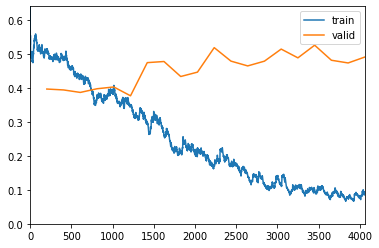

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.913152,0.569574,0.233333,0.766667,0.707500,00:15
1,0.667206,0.468504,0.220000,0.780000,0.742222,00:15
2,0.559841,0.461467,0.193333,0.806667,0.756389,00:15
3,0.516342,0.439348,0.146667,0.853333,0.735556,00:15


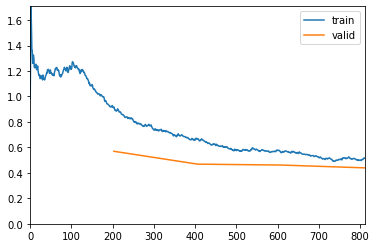

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.454513,0.424928,0.146667,0.853333,0.764722,00:23
1,0.507726,0.430784,0.166667,0.833333,0.753611,00:23
2,0.435678,0.396331,0.153333,0.846667,0.809444,00:23
3,0.411535,0.431538,0.173333,0.826667,0.807778,00:23
4,0.401318,0.427572,0.186667,0.813333,0.828056,00:23
5,0.381413,0.462300,0.166667,0.833333,0.814722,00:23
6,0.327420,0.604944,0.200000,0.800000,0.816667,00:23
7,0.299527,0.385667,0.166667,0.833333,0.887222,00:23
8,0.262913,0.468097,0.146667,0.853333,0.863333,00:23
9,0.203735,0.454493,0.160000,0.840000,0.883055,00:23


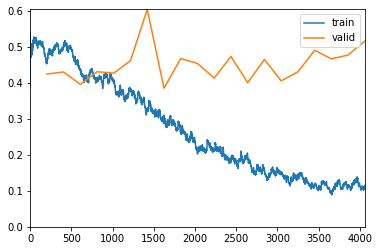

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.912387,0.591107,0.233333,0.766667,0.728333,00:15
1,0.657511,0.416657,0.193333,0.806667,0.782222,00:15
2,0.591200,0.483286,0.226667,0.773333,0.747778,00:15
3,0.522138,0.406511,0.173333,0.826667,0.793611,00:15


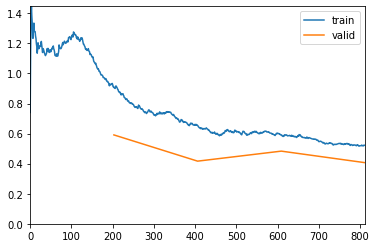

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.503377,0.410093,0.213333,0.786667,0.813056,00:23
1,0.489348,0.388587,0.213333,0.786667,0.833889,00:23
2,0.441625,0.363121,0.146667,0.853333,0.846944,00:23
3,0.401958,0.398464,0.153333,0.846667,0.831389,00:23
4,0.382752,0.449616,0.186667,0.813333,0.805833,00:23
5,0.359934,0.450874,0.186667,0.813333,0.806944,00:23
6,0.333681,0.468961,0.140000,0.860000,0.839722,00:23
7,0.309298,0.391980,0.126667,0.873333,0.856944,00:23
8,0.253881,0.428601,0.120000,0.880000,0.890000,00:23
9,0.225754,0.333634,0.133333,0.866667,0.902500,00:23


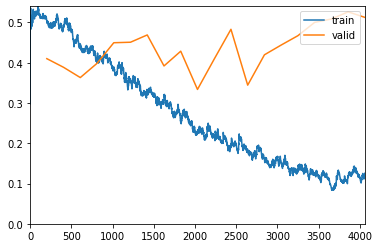

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.911130,0.521433,0.260000,0.740000,0.763889,00:15
1,0.636585,0.423537,0.193333,0.806667,0.799444,00:15
2,0.566715,0.475690,0.193333,0.806667,0.743611,00:15
3,0.513013,0.437838,0.153333,0.846667,0.743056,00:15


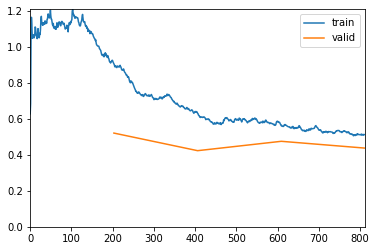

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.470380,0.414290,0.166667,0.833333,0.785556,00:23
1,0.480668,0.402031,0.166667,0.833333,0.802778,00:23
2,0.442282,0.385684,0.186667,0.813333,0.821389,00:23
3,0.420398,0.395564,0.180000,0.820000,0.829445,00:23
4,0.415388,0.457335,0.213333,0.786667,0.808889,00:23
5,0.380742,0.521272,0.166667,0.833333,0.796111,00:23
6,0.320850,0.480117,0.166667,0.833333,0.826667,00:23
7,0.321417,0.504714,0.173333,0.826667,0.806944,00:23
8,0.258177,0.465119,0.146667,0.853333,0.874167,00:23
9,0.217815,0.461113,0.153333,0.846667,0.858333,00:23


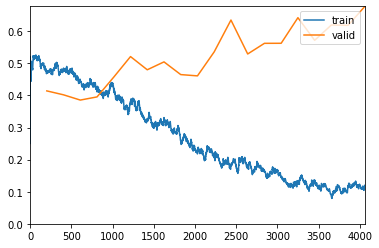

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.855296,0.874273,0.306667,0.693333,0.741944,00:15
1,0.663877,0.449812,0.186667,0.813333,0.775833,00:15
2,0.541665,0.447343,0.180000,0.820000,0.761111,00:15
3,0.525238,0.418866,0.153333,0.846667,0.763056,00:15


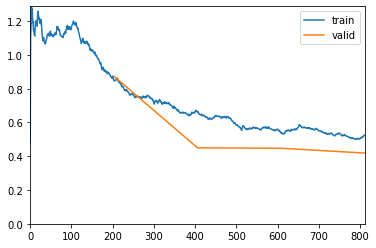

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.473326,0.402432,0.126667,0.873333,0.788056,00:23
1,0.478793,0.415646,0.153333,0.846667,0.787222,00:23
2,0.434969,0.384501,0.153333,0.846667,0.802500,00:23
3,0.396070,0.426021,0.166667,0.833333,0.783611,00:23
4,0.380541,0.396365,0.166667,0.833333,0.830278,00:23
5,0.363712,0.386409,0.126667,0.873333,0.832222,00:23
6,0.335637,0.370008,0.140000,0.860000,0.860833,00:23
7,0.261561,0.363095,0.120000,0.880000,0.866389,00:23
8,0.239485,0.429663,0.140000,0.860000,0.853611,00:23
9,0.192442,0.470872,0.160000,0.840000,0.846667,00:23


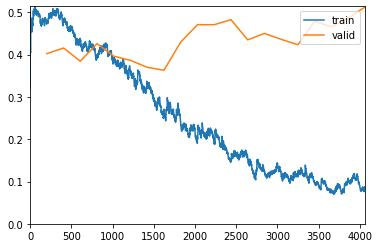

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.956129,0.550388,0.246667,0.753333,0.739444,00:15
1,0.636639,0.473232,0.206667,0.793333,0.734167,00:15
2,0.579027,0.402028,0.166667,0.833333,0.799722,00:15
3,0.488762,0.406004,0.146667,0.853333,0.795278,00:15


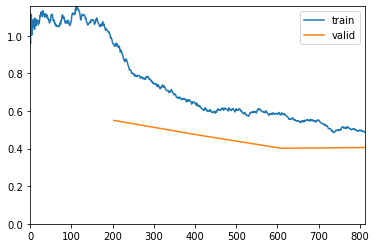

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.516786,0.400973,0.153333,0.846667,0.796111,00:23
1,0.472018,0.409084,0.160000,0.840000,0.802222,00:23
2,0.455427,0.388820,0.140000,0.860000,0.818889,00:23
3,0.416405,0.357755,0.153333,0.846667,0.863889,00:23
4,0.396506,0.376820,0.153333,0.846667,0.859444,00:23
5,0.351603,0.466105,0.180000,0.820000,0.820556,00:23
6,0.336091,0.422696,0.166667,0.833333,0.832500,00:23
7,0.292560,0.386181,0.146667,0.853333,0.864445,00:23
8,0.278808,0.399841,0.166667,0.833333,0.854167,00:23
9,0.222987,0.494989,0.160000,0.840000,0.826389,00:23


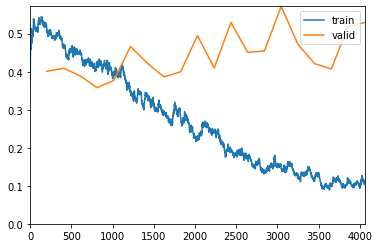

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.948092,0.537855,0.240000,0.760000,0.793889,00:15
1,0.681601,0.448698,0.200000,0.800000,0.772778,00:15
2,0.593913,0.396347,0.173333,0.826667,0.811667,00:15
3,0.526098,0.451803,0.173333,0.826667,0.774722,00:15


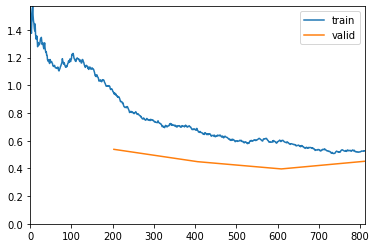

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.516703,0.409166,0.173333,0.826667,0.789445,00:23
1,0.496341,0.425990,0.193333,0.806667,0.782778,00:23
2,0.480001,0.394840,0.160000,0.840000,0.807222,00:23
3,0.418914,0.404438,0.180000,0.820000,0.813611,00:23
4,0.405794,0.480781,0.206667,0.793333,0.775556,00:23
5,0.373319,0.446133,0.180000,0.820000,0.817778,00:23
6,0.348559,0.392501,0.186667,0.813333,0.847778,00:23
7,0.284118,0.531836,0.173333,0.826667,0.822500,00:23
8,0.247258,0.433376,0.193333,0.806667,0.853333,00:23
9,0.226918,0.473178,0.133333,0.866667,0.848333,00:23


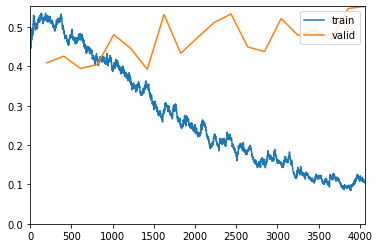

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.964371,0.554233,0.246667,0.753333,0.723333,00:15
1,0.675729,0.454805,0.226667,0.773333,0.770833,00:15
2,0.566222,0.402321,0.173333,0.826667,0.804444,00:15
3,0.488903,0.420887,0.173333,0.826667,0.784167,00:15


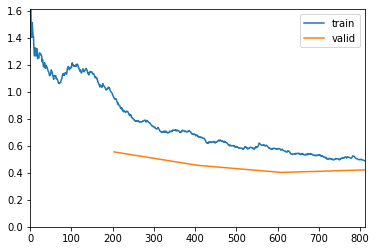

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.518585,0.415937,0.166667,0.833333,0.783056,00:23
1,0.494612,0.423572,0.166667,0.833333,0.781945,00:23
2,0.450933,0.462476,0.193333,0.806667,0.774722,00:23
3,0.420426,0.429354,0.193333,0.806667,0.819722,00:23
4,0.385950,0.459131,0.206667,0.793333,0.805833,00:23
5,0.369924,0.412896,0.160000,0.840000,0.840833,00:23
6,0.339112,0.424519,0.186667,0.813333,0.844167,00:23
7,0.278033,0.501301,0.166667,0.833333,0.849444,00:23
8,0.272639,0.523292,0.186667,0.813333,0.828056,00:23
9,0.227739,0.526815,0.193333,0.806667,0.850278,00:23


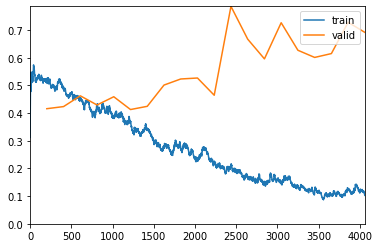

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.930533,0.635007,0.246667,0.753333,0.785000,00:15
1,0.653026,0.470569,0.166667,0.833333,0.751667,00:15
2,0.557212,0.456852,0.206667,0.793333,0.745000,00:15
3,0.507524,0.439612,0.193333,0.806667,0.782500,00:15


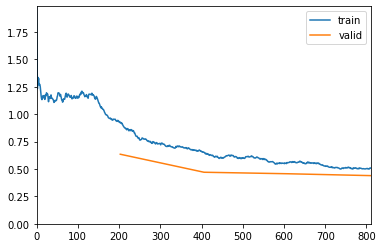

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.508878,0.422965,0.180000,0.820000,0.777222,00:23
1,0.493975,0.424300,0.180000,0.820000,0.776111,00:23
2,0.458284,0.418843,0.160000,0.840000,0.788056,00:23
3,0.393805,0.386312,0.140000,0.860000,0.825833,00:23
4,0.374200,0.404122,0.166667,0.833333,0.831389,00:23
5,0.328159,0.479181,0.166667,0.833333,0.806389,00:23
6,0.309778,0.420285,0.146667,0.853333,0.823056,00:23
7,0.270566,0.438664,0.140000,0.860000,0.832778,00:23
8,0.229483,0.454727,0.146667,0.853333,0.838056,00:23
9,0.205771,0.437328,0.146667,0.853333,0.859167,00:23


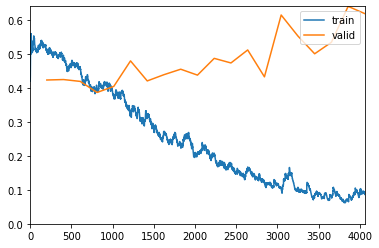

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.899010,0.588825,0.220000,0.780000,0.768333,00:15
1,0.654375,0.522320,0.233333,0.766667,0.770556,00:15
2,0.563304,0.378450,0.146667,0.853333,0.833611,00:15
3,0.480563,0.418545,0.166667,0.833333,0.778611,00:15


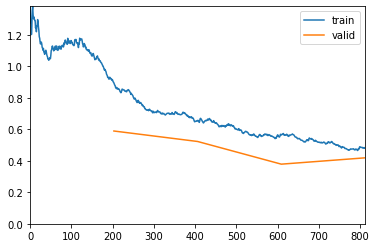

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.488439,0.409036,0.186667,0.813333,0.786944,00:23
1,0.473601,0.396789,0.160000,0.840000,0.804722,00:23
2,0.450159,0.407000,0.186667,0.813333,0.820000,00:23
3,0.410032,0.413291,0.160000,0.840000,0.823055,00:23
4,0.385111,0.380704,0.126667,0.873333,0.855278,00:23
5,0.346094,0.382383,0.133333,0.866667,0.870556,00:23
6,0.300537,0.469599,0.166667,0.833333,0.857778,00:23
7,0.280910,0.383922,0.133333,0.866667,0.884167,00:23
8,0.269710,0.469945,0.180000,0.820000,0.858333,00:23
9,0.230074,0.456819,0.160000,0.840000,0.856945,00:23


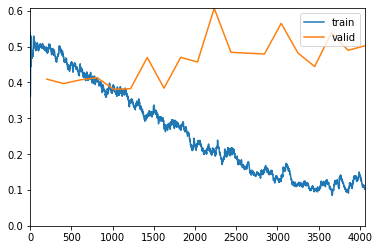

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.960710,0.687257,0.300000,0.700000,0.722778,00:15
1,0.662996,0.478589,0.226667,0.773333,0.763056,00:15
2,0.553614,0.425162,0.193333,0.806667,0.804167,00:15
3,0.508148,0.427539,0.200000,0.800000,0.773333,00:15


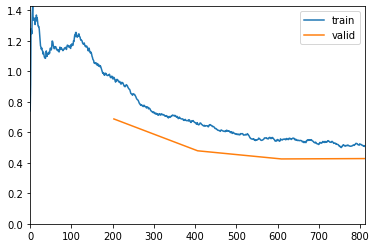

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.500667,0.404146,0.186667,0.813333,0.795000,00:23
1,0.509199,0.397695,0.206667,0.793333,0.826111,00:23
2,0.461849,0.420510,0.193333,0.806667,0.828889,00:23
3,0.434142,0.389281,0.186667,0.813333,0.838889,00:23
4,0.392271,0.405800,0.173333,0.826667,0.829167,00:23
5,0.365799,0.358971,0.140000,0.860000,0.875833,00:23
6,0.313911,0.359158,0.153333,0.846667,0.851945,00:23
7,0.287890,0.457354,0.173333,0.826667,0.830278,00:23
8,0.247764,0.495077,0.173333,0.826667,0.853611,00:23
9,0.213937,0.425197,0.166667,0.833333,0.870556,00:23


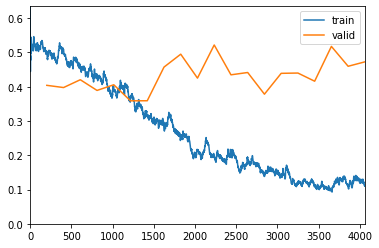

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.928844,0.792026,0.320000,0.680000,0.758056,00:15
1,0.649114,0.566762,0.253333,0.746667,0.760833,00:15
2,0.550834,0.456414,0.213333,0.786667,0.781667,00:15
3,0.487898,0.460085,0.206667,0.793333,0.738889,00:15


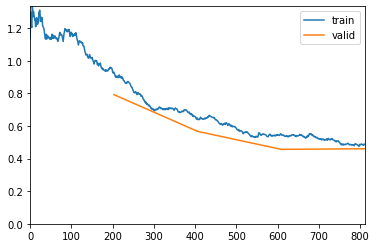

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.499026,0.450780,0.186667,0.813333,0.753056,00:23
1,0.487497,0.434430,0.206667,0.793333,0.779444,00:23
2,0.455907,0.438733,0.206667,0.793333,0.805278,00:23
3,0.431461,0.446652,0.200000,0.800000,0.785833,00:23
4,0.390612,0.443470,0.180000,0.820000,0.788611,00:23
5,0.359049,0.499066,0.153333,0.846667,0.785000,00:23
6,0.308926,0.511240,0.200000,0.800000,0.780278,00:23
7,0.291200,0.547790,0.186667,0.813333,0.782778,00:23
8,0.236157,0.577410,0.206667,0.793333,0.818055,00:23
9,0.213831,0.591416,0.186667,0.813333,0.798333,00:23


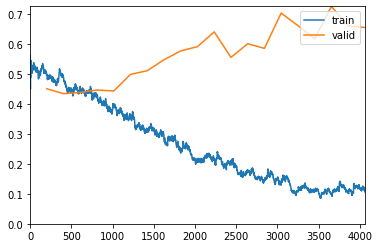

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.883135,0.745265,0.260000,0.740000,0.705000,00:15
1,0.639064,0.502346,0.213333,0.786667,0.729445,00:15
2,0.545457,0.420795,0.193333,0.806667,0.805833,00:15
3,0.469436,0.432109,0.146667,0.853333,0.763333,00:15


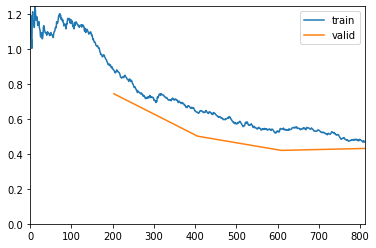

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.495035,0.426716,0.140000,0.860000,0.758333,00:23
1,0.492527,0.391087,0.133333,0.866667,0.798611,00:23
2,0.428639,0.388419,0.146667,0.853333,0.826667,00:23
3,0.379042,0.388914,0.153333,0.846667,0.843333,00:23
4,0.363095,0.453945,0.193333,0.806667,0.838056,00:23
5,0.346804,0.354877,0.146667,0.853333,0.869167,00:23
6,0.276432,0.397396,0.133333,0.866667,0.842222,00:23
7,0.248878,0.449858,0.153333,0.846667,0.836944,00:23
8,0.218034,0.597666,0.186667,0.813333,0.864167,00:23
9,0.200223,0.539436,0.166667,0.833333,0.859445,00:23


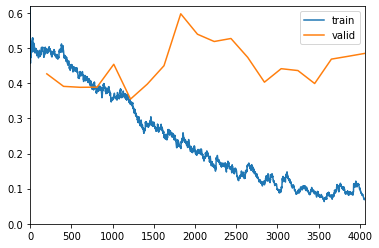

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.957646,0.528214,0.253333,0.746667,0.783056,00:15
1,0.659652,0.471715,0.200000,0.800000,0.733333,00:15
2,0.550920,0.449149,0.173333,0.826667,0.778889,00:15
3,0.499411,0.415764,0.173333,0.826667,0.794722,00:15


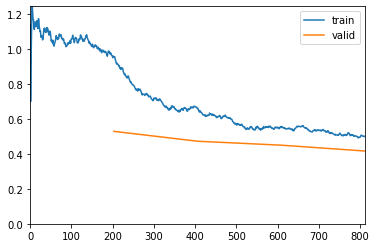

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.497022,0.409893,0.160000,0.840000,0.798889,00:23
1,0.471243,0.375629,0.160000,0.840000,0.841667,00:23
2,0.461881,0.448307,0.193333,0.806667,0.782778,00:23
3,0.395946,0.371157,0.166667,0.833333,0.834444,00:23
4,0.361096,0.369296,0.180000,0.820000,0.853889,00:23
5,0.370106,0.406073,0.166667,0.833333,0.860000,00:23
6,0.320764,0.361221,0.126667,0.873333,0.866944,00:23
7,0.328309,0.439203,0.193333,0.806667,0.849167,00:23
8,0.253192,0.455518,0.166667,0.833333,0.854167,00:23
9,0.260543,0.339686,0.133333,0.866667,0.884167,00:23


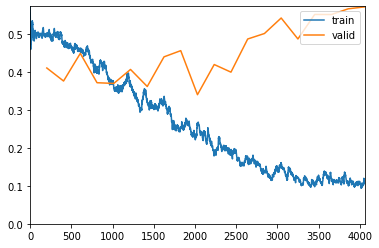

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.917426,0.523836,0.240000,0.760000,0.773333,00:15
1,0.655197,0.421500,0.180000,0.820000,0.822500,00:15
2,0.575253,0.483884,0.253333,0.746667,0.765000,00:15
3,0.499785,0.423060,0.220000,0.780000,0.783889,00:15


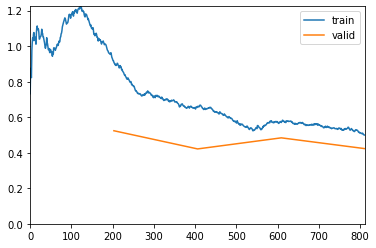

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.493773,0.409683,0.226667,0.773333,0.796111,00:23
1,0.499719,0.381515,0.193333,0.806667,0.819444,00:23
2,0.473585,0.382216,0.166667,0.833333,0.822222,00:23
3,0.426528,0.346732,0.126667,0.873333,0.862500,00:23
4,0.336603,0.403020,0.160000,0.840000,0.841389,00:23
5,0.355407,0.419761,0.160000,0.840000,0.836944,00:23
6,0.331619,0.362275,0.153333,0.846667,0.861945,00:23
7,0.311534,0.358612,0.173333,0.826667,0.884444,00:23
8,0.262047,0.532073,0.173333,0.826667,0.820278,00:23
9,0.270417,0.385693,0.160000,0.840000,0.865000,00:23


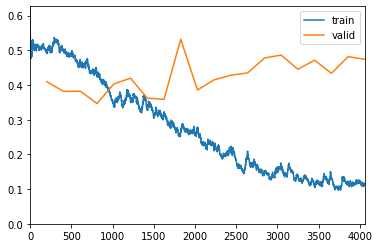

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.944943,0.542533,0.220000,0.780000,0.733889,00:15
1,0.638761,0.420297,0.186667,0.813333,0.777222,00:15
2,0.543029,0.478901,0.246667,0.753333,0.766667,00:15
3,0.496786,0.445820,0.186667,0.813333,0.753055,00:15


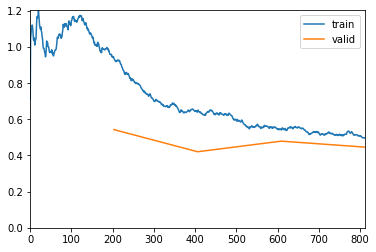

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.475469,0.436717,0.173333,0.826667,0.761389,00:23
1,0.481503,0.431570,0.213333,0.786667,0.778333,00:23
2,0.474962,0.398315,0.173333,0.826667,0.812222,00:23
3,0.398115,0.382015,0.160000,0.840000,0.848056,00:23
4,0.318734,0.432743,0.186667,0.813333,0.819722,00:23
5,0.349866,0.438706,0.146667,0.853333,0.821667,00:23
6,0.332899,0.481035,0.213333,0.786667,0.796667,00:23
7,0.316051,0.460785,0.186667,0.813333,0.811945,00:23
8,0.275290,0.711024,0.200000,0.800000,0.767222,00:23
9,0.261118,0.522186,0.200000,0.800000,0.780556,00:23


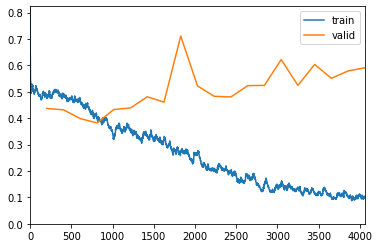

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.902699,0.493923,0.193333,0.806667,0.770833,00:15
1,0.646144,0.474325,0.180000,0.820000,0.757778,00:15
2,0.566035,0.429830,0.186667,0.813333,0.800833,00:15
3,0.497363,0.434874,0.220000,0.780000,0.781389,00:15


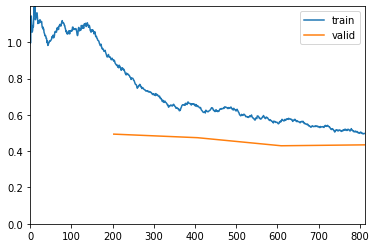

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.482356,0.412908,0.166667,0.833333,0.782500,00:23
1,0.485335,0.383652,0.180000,0.820000,0.818611,00:23
2,0.457509,0.384149,0.160000,0.840000,0.813333,00:23
3,0.422872,0.427240,0.166667,0.833333,0.802222,00:23
4,0.359267,0.394366,0.160000,0.840000,0.834167,00:23
5,0.335489,0.466653,0.146667,0.853333,0.816111,00:23
6,0.312461,0.436089,0.133333,0.866667,0.834445,00:23
7,0.308567,0.405692,0.180000,0.820000,0.851944,00:23
8,0.220903,0.537846,0.173333,0.826667,0.889167,00:23
9,0.241368,0.418789,0.153333,0.846667,0.908333,00:23


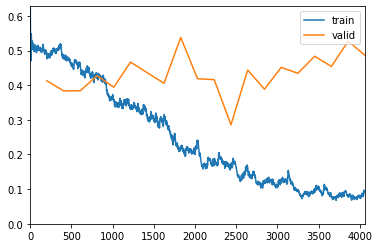

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.942055,0.634658,0.286667,0.713333,0.743333,00:15
1,0.635262,0.485524,0.206667,0.793333,0.744167,00:15
2,0.563268,0.415831,0.186667,0.813333,0.772500,00:15
3,0.505545,0.409164,0.160000,0.840000,0.803333,00:15


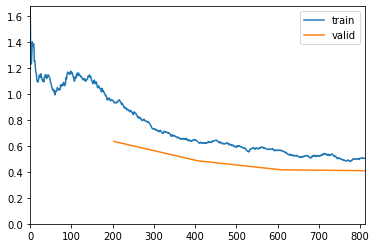

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.508949,0.401340,0.173333,0.826667,0.801945,00:23
1,0.467938,0.387263,0.160000,0.840000,0.818333,00:23
2,0.454454,0.381648,0.160000,0.840000,0.832778,00:23
3,0.439200,0.370494,0.160000,0.840000,0.848611,00:23
4,0.401840,0.372042,0.153333,0.846667,0.863611,00:23
5,0.335844,0.440398,0.166667,0.833333,0.804722,00:23
6,0.334144,0.387508,0.173333,0.826667,0.833611,00:23
7,0.314943,0.469918,0.173333,0.826667,0.828333,00:23
8,0.282578,0.423489,0.173333,0.826667,0.835000,00:23
9,0.232741,0.421901,0.126667,0.873333,0.857222,00:23


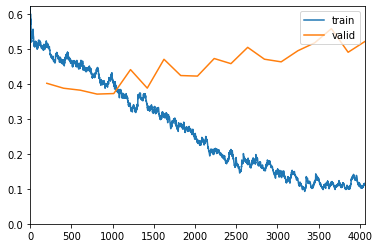

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.947574,0.616756,0.306667,0.693333,0.704167,00:15
1,0.679872,0.461964,0.206667,0.793333,0.732500,00:15
2,0.585273,0.425742,0.173333,0.826667,0.772500,00:15
3,0.528324,0.415594,0.173333,0.826667,0.790278,00:15


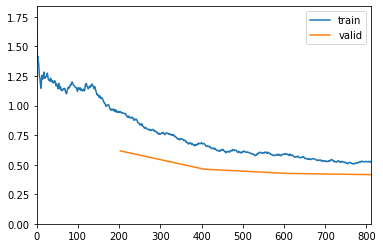

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.508289,0.419549,0.173333,0.826667,0.795000,00:23
1,0.470213,0.399612,0.166667,0.833333,0.802222,00:23
2,0.438196,0.400391,0.160000,0.840000,0.811667,00:23
3,0.442234,0.413202,0.220000,0.780000,0.814722,00:23
4,0.410904,0.334525,0.153333,0.846667,0.886944,00:23
5,0.337391,0.491107,0.186667,0.813333,0.833056,00:23
6,0.334614,0.352463,0.180000,0.820000,0.870833,00:23
7,0.310586,0.372776,0.166667,0.833333,0.879167,00:23
8,0.298640,0.402364,0.173333,0.826667,0.844722,00:23
9,0.247287,0.481331,0.160000,0.840000,0.862778,00:23


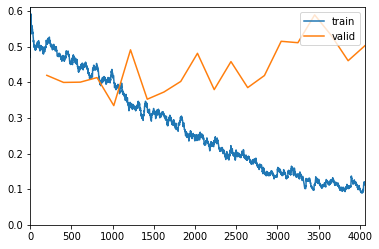

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.908507,0.783159,0.353333,0.646667,0.672500,00:15
1,0.651389,0.504860,0.186667,0.813333,0.723056,00:15
2,0.549958,0.392382,0.146667,0.853333,0.817778,00:15
3,0.510774,0.413784,0.206667,0.793333,0.800833,00:15


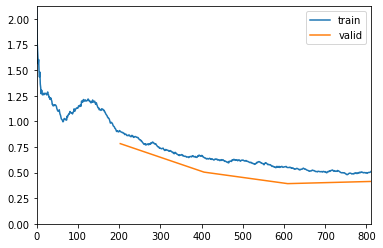

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.483185,0.417534,0.180000,0.820000,0.791667,00:23
1,0.478351,0.433990,0.180000,0.820000,0.781389,00:23
2,0.441679,0.438491,0.193333,0.806667,0.781667,00:23
3,0.430612,0.429897,0.180000,0.820000,0.807778,00:23
4,0.402372,0.412939,0.140000,0.860000,0.825278,00:23
5,0.349764,0.440038,0.200000,0.800000,0.853611,00:23
6,0.342637,0.476355,0.206667,0.793333,0.794722,00:23
7,0.320525,0.470926,0.166667,0.833333,0.835556,00:23
8,0.281361,0.440757,0.200000,0.800000,0.826667,00:23
9,0.246202,0.476187,0.173333,0.826667,0.831667,00:23


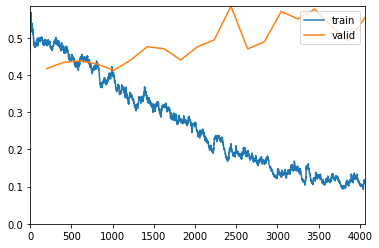

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.913941,0.635922,0.273333,0.726667,0.734167,00:15
1,0.639747,0.480038,0.213333,0.786667,0.747222,00:15
2,0.565916,0.452459,0.193333,0.806667,0.775556,00:15
3,0.498578,0.414279,0.180000,0.820000,0.803611,00:15


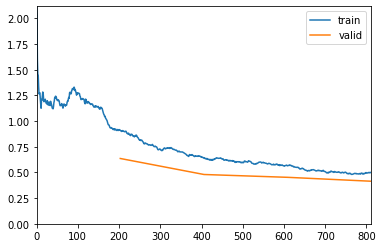

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.493165,0.414219,0.186667,0.813333,0.808333,00:23
1,0.472509,0.387412,0.140000,0.860000,0.811389,00:23
2,0.428743,0.385798,0.153333,0.846667,0.823611,00:23
3,0.407874,0.403939,0.186667,0.813333,0.825000,00:23
4,0.401775,0.364335,0.140000,0.860000,0.860278,00:23
5,0.335436,0.403950,0.153333,0.846667,0.857222,00:23
6,0.312860,0.367218,0.133333,0.866667,0.860833,00:23
7,0.274852,0.416969,0.126667,0.873333,0.880278,00:23
8,0.245641,0.410076,0.153333,0.846667,0.847778,00:23
9,0.206678,0.409346,0.140000,0.860000,0.880833,00:23


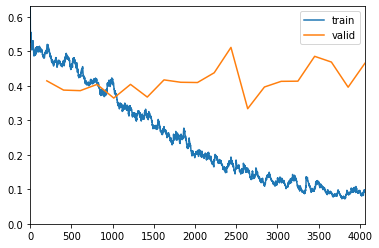

In [33]:
seeds = range(1,11)
epochs = 20

for seed in seeds:
#     Baseline
    data = reload_dataset(dm,seed=seed)    
    baseline_acc = train_and_return_metrics(data,seed,epochs)
    
    #max rgb
    data = reload_dataset(dm,seed=seed)
    add_max_rgb(data)
    max_rgb_acc = train_and_return_metrics(data,seed,epochs)
    
    #Shades of gray
    data = reload_dataset(dm,seed=seed)
    add_shades_of_gray(data)
    shades_of_gray_acc = train_and_return_metrics(data,seed,epochs)
    
    #ben graham
    data = reload_dataset_ben(dm,seed=seed)
    ben_graham_acc = train_and_return_metrics(data,seed,epochs)

    
#     write_results(seed, baseline_acc, max_rgb_acc,shades_of_gray_acc)
    write_results(seed,baseline_acc, max_rgb_acc,shades_of_gray_acc,ben_graham_acc)
    
    

# Analyze results

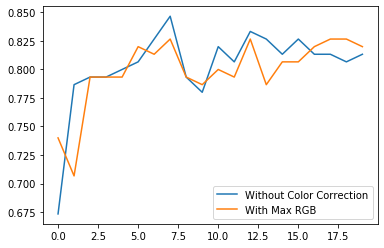

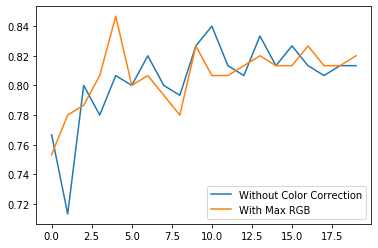

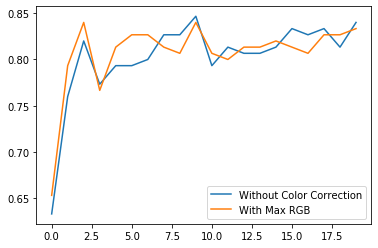

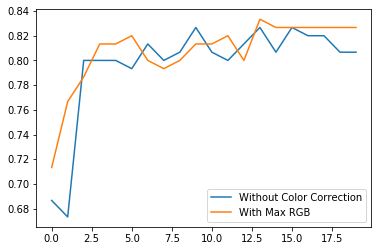

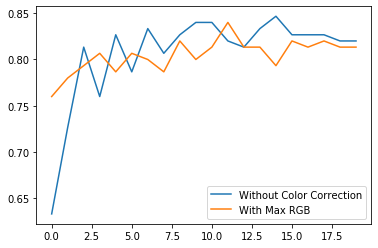

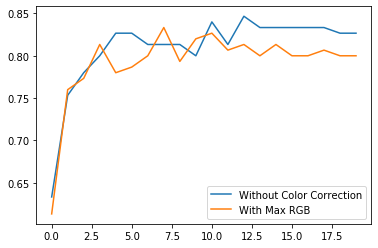

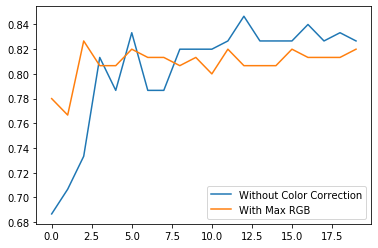

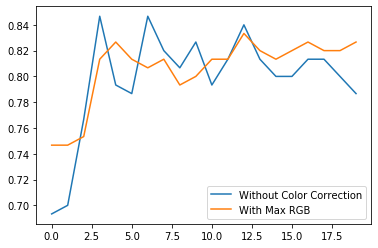

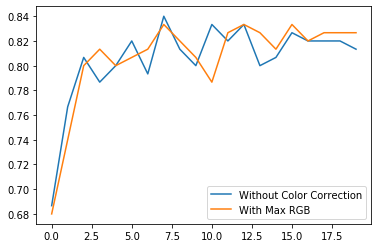

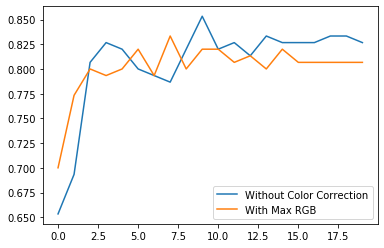

In [35]:
runs = {}
for i in range(1,11):
    runs[i] = pd.read_csv(f'{results_file_name}_{i}.txt')
#     runs[i] = pd.read_csv(f'fan_run_seed_{i}.txt')

    runs[i].plot()

In [37]:
max_acc_for_each_run_max_rgb = [runs[r].max()['With Max RGB'] for r in runs]
max_acc_for_each_run_baseline = [runs[r].max()['Without Color Correction'] for r in runs]


In [38]:
df = pd.DataFrame({
                    'Baseline':max_acc_for_each_run_baseline,
                    'Max RGB': max_acc_for_each_run_max_rgb
                })

In [39]:
df.describe()

,Baseline,Max RGB
count,10.000000,10.000000
mean,0.844000,0.834667
std,0.007166,0.006126
min,0.826667,0.826667
25%,0.841667,0.833333
50%,0.846667,0.833333
75%,0.846667,0.838333
max,0.853333,0.846667


In [40]:
avg_max_rgb_acc = np.mean(max_acc_for_each_run_max_rgb)
std_max_rgb_acc = np.std(max_acc_for_each_run_max_rgb)



avg_baseline_acc = np.mean(max_acc_for_each_run_baseline)
std_baseline_acc = np.std(max_acc_for_each_run_baseline)

In [41]:
avg_max_rgb_acc,std_max_rgb_acc

(0.8346666514873504, 0.005811872022261097)

In [42]:
avg_baseline_acc,std_baseline_acc

(0.8440000116825104, 0.006798708410992281)

In [161]:


times_max_rgb_had_higher_acc = [runs[i].max()['Without Color Correction'] < runs[i].max()['With Max RGB'] for i in runs]

arl_effectiveness = sum(times_max_rgb_had_higher_acc)/ len(runs)

print(f'MAX RGB improved the Accuracy in {arl_effectiveness*100}% of the cases')

MAX RGB improved the Accuracy in 20.0% of the cases


# Shades of Gray

In [36]:
results_file_name = 'color_analysis_run_seed_shades'
columns = ['Without Color Correction','With Shades of Gray p=6']
def write_results(seed,first_learner,second_learner):
    l1 = list(map(lambda x: x[1], first_learner.recorder.metrics))
    l2 = list(map(lambda x: x[1], second_learner.recorder.metrics))

    f = open(f'{results_file_name}_{seed}.txt','w+')
    f.write(','.join(columns) + '\n')
    run = ''.join(map(str,[f'{a.item()},{b.item()}\n' for a,b in zip(l1,l2) ]))
    f.write(run)
    f.close()

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,1.057071,0.669157,0.220000,0.780000,0.692222,00:05
1,0.618928,0.523040,0.206667,0.793333,0.695278,00:05
2,0.516425,0.494786,0.193333,0.806667,0.721389,00:05
3,0.443267,0.445440,0.180000,0.820000,0.765000,00:05


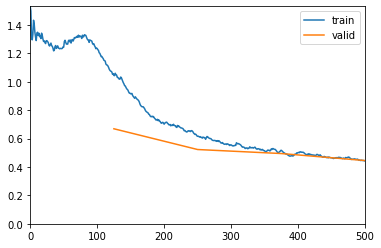

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.233288,0.424613,0.166667,0.833333,0.778333,00:07
1,0.145730,0.433644,0.173333,0.826667,0.797222,00:07
2,0.099346,0.496575,0.166667,0.833333,0.755833,00:07
3,0.381916,0.465367,0.193333,0.806667,0.791389,00:07
4,0.383188,0.447222,0.193333,0.806667,0.811389,00:07
5,0.394556,0.421298,0.180000,0.820000,0.801389,00:07
6,0.386005,0.447728,0.193333,0.806667,0.789167,00:07
7,0.384954,0.503985,0.200000,0.800000,0.738889,00:07
8,0.396131,0.449751,0.206667,0.793333,0.788611,00:07
9,0.376802,0.460437,0.186667,0.813333,0.788611,00:07


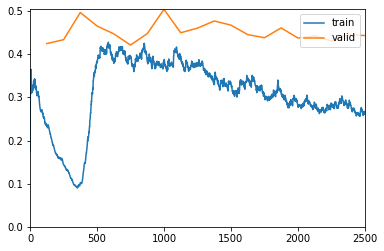

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,1.107128,0.743928,0.206667,0.793333,0.681944,00:05
1,0.627828,0.545963,0.200000,0.800000,0.719444,00:05
2,0.512811,0.503476,0.193333,0.806667,0.741945,00:05
3,0.442727,0.445647,0.186667,0.813333,0.781111,00:05


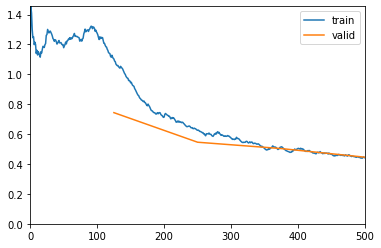

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.209610,0.436157,0.180000,0.820000,0.795000,00:07
1,0.141553,0.470597,0.193333,0.806667,0.793611,00:07
2,0.098431,0.540635,0.186667,0.813333,0.781944,00:07
3,0.377727,0.501282,0.180000,0.820000,0.750000,00:07
4,0.393068,0.456021,0.186667,0.813333,0.790278,00:07
5,0.397070,0.518750,0.193333,0.806667,0.767778,00:07
6,0.406463,0.544477,0.193333,0.806667,0.734167,00:07
7,0.396694,0.465475,0.193333,0.806667,0.772222,00:07
8,0.385931,0.504520,0.193333,0.806667,0.760556,00:07
9,0.375081,0.528648,0.200000,0.800000,0.759167,00:07


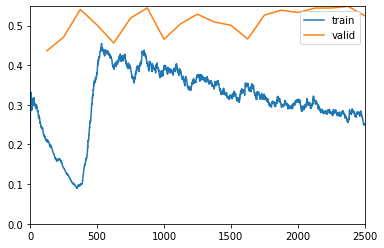

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,1.037970,0.571527,0.206667,0.793333,0.691389,00:05
1,0.608955,0.514215,0.186667,0.813333,0.680555,00:05
2,0.504882,0.465125,0.193333,0.806667,0.770000,00:05
3,0.452088,0.452988,0.200000,0.800000,0.764722,00:05


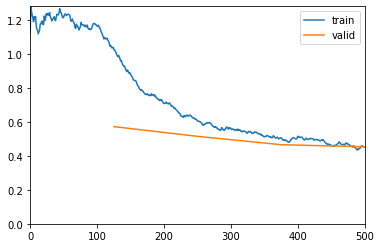

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.218871,0.430515,0.200000,0.800000,0.797222,00:07
1,0.136821,0.440594,0.193333,0.806667,0.808056,00:07
2,0.095362,0.475000,0.180000,0.820000,0.809167,00:07
3,0.385706,0.460327,0.180000,0.820000,0.757500,00:07
4,0.428197,0.453449,0.193333,0.806667,0.791667,00:07
5,0.427412,0.476071,0.173333,0.826667,0.774722,00:07
6,0.396714,0.471587,0.166667,0.833333,0.767222,00:07
7,0.385818,0.471594,0.173333,0.826667,0.783611,00:07
8,0.387415,0.476376,0.173333,0.826667,0.771667,00:07
9,0.348256,0.432275,0.166667,0.833333,0.816667,00:07


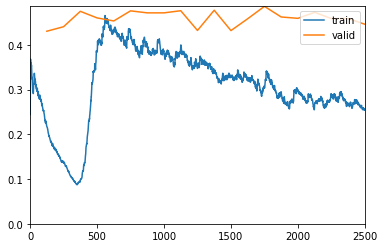

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,1.020733,0.835713,0.313333,0.686667,0.644167,00:05
1,0.617416,0.514177,0.206667,0.793333,0.696389,00:05
2,0.509272,0.475301,0.173333,0.826667,0.732222,00:05
3,0.418878,0.463308,0.186667,0.813333,0.774722,00:05


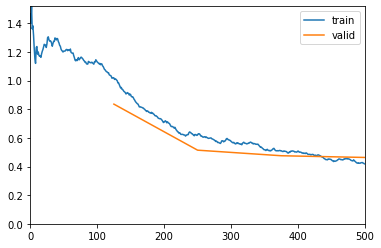

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.225634,0.465478,0.193333,0.806667,0.789167,00:07
1,0.156585,0.479336,0.193333,0.806667,0.787222,00:07
2,0.109457,0.524027,0.186667,0.813333,0.745833,00:07
3,0.364701,0.465217,0.173333,0.826667,0.780000,00:07
4,0.422581,0.431341,0.160000,0.840000,0.796944,00:07
5,0.421540,0.462588,0.193333,0.806667,0.786944,00:07
6,0.408949,0.467264,0.146667,0.853333,0.774722,00:07
7,0.399336,0.557503,0.173333,0.826667,0.756389,00:07
8,0.391434,0.475589,0.160000,0.840000,0.799722,00:07
9,0.352577,0.483551,0.160000,0.840000,0.816389,00:07


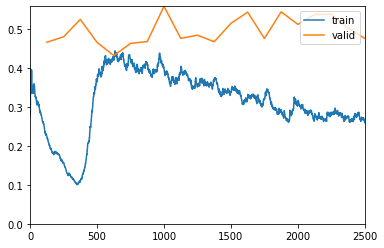

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.969682,0.848193,0.366667,0.633333,0.633333,00:05
1,0.607500,0.600890,0.186667,0.813333,0.613056,00:05
2,0.491588,0.470021,0.193333,0.806667,0.741667,00:05
3,0.454705,0.498715,0.213333,0.786667,0.726389,00:05


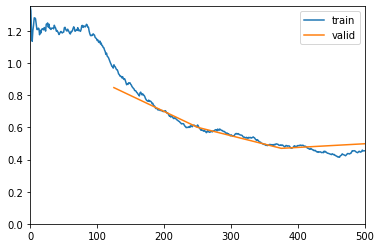

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.227464,0.486244,0.213333,0.786667,0.739722,00:07
1,0.136134,0.494577,0.193333,0.806667,0.756944,00:07
2,0.088694,0.510314,0.213333,0.786667,0.748611,00:07
3,0.396447,0.572102,0.220000,0.780000,0.720833,00:07
4,0.426630,0.506196,0.206667,0.793333,0.734167,00:07
5,0.398762,0.467124,0.186667,0.813333,0.764167,00:07
6,0.397615,0.437744,0.186667,0.813333,0.812500,00:07
7,0.394045,0.414656,0.173333,0.826667,0.828611,00:07
8,0.374310,0.496193,0.186667,0.813333,0.759444,00:07
9,0.356716,0.465735,0.166667,0.833333,0.814722,00:07


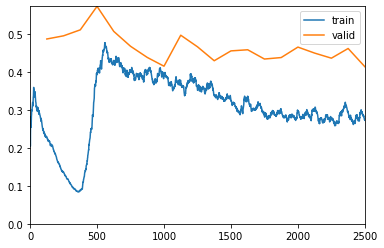

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,1.031345,0.879055,0.213333,0.786667,0.553889,00:05
1,0.599963,0.583351,0.180000,0.820000,0.708056,00:05
2,0.522281,0.473984,0.180000,0.820000,0.745000,00:05
3,0.448382,0.461172,0.186667,0.813333,0.771667,00:05


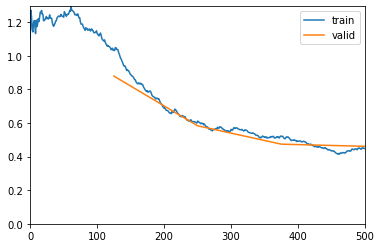

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.225555,0.468991,0.186667,0.813333,0.763056,00:07
1,0.140896,0.517148,0.193333,0.806667,0.763611,00:07
2,0.104140,0.489248,0.180000,0.820000,0.788611,00:07
3,0.390954,0.532206,0.166667,0.833333,0.743056,00:07
4,0.415841,0.561407,0.180000,0.820000,0.741667,00:07
5,0.378642,0.544861,0.193333,0.806667,0.756944,00:07
6,0.417347,0.563185,0.173333,0.826667,0.730833,00:07
7,0.405048,0.474376,0.180000,0.820000,0.755000,00:07
8,0.368030,0.460433,0.160000,0.840000,0.831667,00:07
9,0.374347,0.517012,0.166667,0.833333,0.794722,00:07


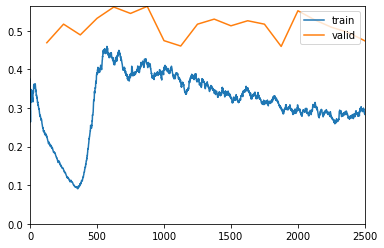

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,1.087467,0.632646,0.273333,0.726667,0.680000,00:05
1,0.592267,0.512361,0.233333,0.766667,0.690556,00:05
2,0.482988,0.491160,0.186667,0.813333,0.728056,00:05
3,0.474027,0.450540,0.193333,0.806667,0.765833,00:05


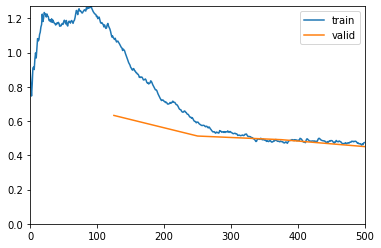

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.221328,0.456343,0.186667,0.813333,0.778056,00:07
1,0.145127,0.440603,0.180000,0.820000,0.780833,00:07
2,0.096174,0.519206,0.186667,0.813333,0.741944,00:07
3,0.391472,0.488602,0.173333,0.826667,0.779444,00:07
4,0.429190,0.465186,0.180000,0.820000,0.764444,00:07
5,0.425461,0.450669,0.193333,0.806667,0.768056,00:07
6,0.405340,0.452540,0.186667,0.813333,0.801667,00:07
7,0.369817,0.451230,0.193333,0.806667,0.771944,00:07
8,0.376639,0.411088,0.180000,0.820000,0.818056,00:07
9,0.348355,0.393249,0.166667,0.833333,0.835000,00:07


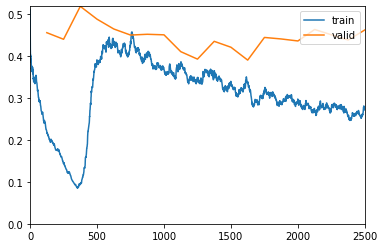

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,1.121521,0.931562,0.220000,0.780000,0.564167,00:05
1,0.620560,0.549405,0.193333,0.806667,0.657778,00:05
2,0.492344,0.491301,0.193333,0.806667,0.811389,00:05
3,0.470879,0.514316,0.193333,0.806667,0.776111,00:05


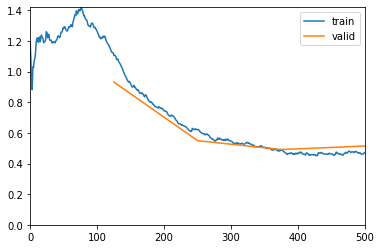

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.218272,0.511059,0.193333,0.806667,0.791667,00:07
1,0.152210,0.503069,0.193333,0.806667,0.790278,00:07
2,0.082441,0.567249,0.180000,0.820000,0.790278,00:07
3,0.399181,0.503375,0.193333,0.806667,0.777778,00:07
4,0.437454,0.547931,0.173333,0.826667,0.741111,00:07
5,0.437907,0.453215,0.186667,0.813333,0.790555,00:07
6,0.422669,0.491828,0.193333,0.806667,0.765556,00:07
7,0.389307,0.475251,0.186667,0.813333,0.807778,00:07
8,0.374003,0.420103,0.180000,0.820000,0.807778,00:07
9,0.370463,0.410421,0.160000,0.840000,0.818056,00:07


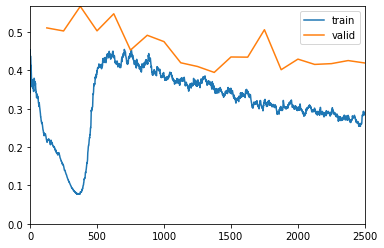

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,1.090383,0.658220,0.293333,0.706667,0.676389,00:05
1,0.630917,0.468090,0.193333,0.806667,0.755278,00:05
2,0.495623,0.426091,0.160000,0.840000,0.779722,00:05
3,0.449279,0.422033,0.160000,0.840000,0.793889,00:05


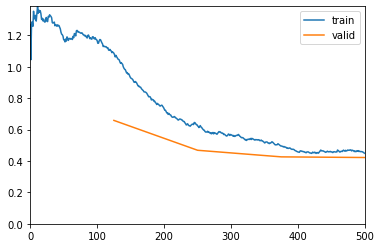

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.202996,0.422540,0.173333,0.826667,0.797222,00:07
1,0.137262,0.431560,0.173333,0.826667,0.809444,00:07
2,0.096449,0.439726,0.160000,0.840000,0.798333,00:07
3,0.381726,0.472875,0.173333,0.826667,0.788056,00:07
4,0.410532,0.455217,0.160000,0.840000,0.781111,00:07
5,0.407773,0.494069,0.200000,0.800000,0.765000,00:07
6,0.392153,0.416825,0.166667,0.833333,0.822500,00:07
7,0.385909,0.458864,0.193333,0.806667,0.790833,00:07
8,0.384936,0.407772,0.160000,0.840000,0.822778,00:07
9,0.366375,0.441840,0.186667,0.813333,0.806667,00:07


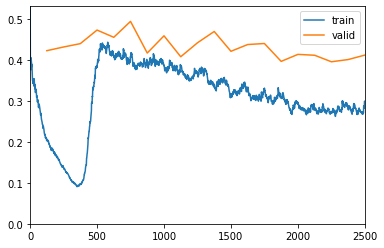

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,1.013965,0.875213,0.300000,0.700000,0.557500,00:05
1,0.635477,0.472648,0.220000,0.780000,0.732222,00:05
2,0.502738,0.503626,0.200000,0.800000,0.700000,00:05
3,0.431592,0.434638,0.186667,0.813333,0.798889,00:05


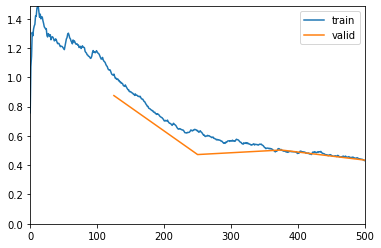

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.221758,0.435350,0.180000,0.820000,0.809722,00:07
1,0.150373,0.512033,0.186667,0.813333,0.775556,00:07
2,0.097162,0.540411,0.180000,0.820000,0.742222,00:07
3,0.358335,0.493299,0.193333,0.806667,0.785556,00:07
4,0.443888,0.454879,0.173333,0.826667,0.775833,00:07
5,0.423181,0.476947,0.186667,0.813333,0.788611,00:07
6,0.418019,0.441252,0.180000,0.820000,0.818611,00:07
7,0.396605,0.464054,0.180000,0.820000,0.803333,00:07
8,0.375618,0.419337,0.166667,0.833333,0.828333,00:07
9,0.360796,0.444930,0.180000,0.820000,0.810000,00:07


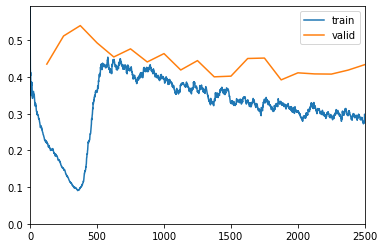

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,1.050727,1.327117,0.393333,0.606667,0.499722,00:05
1,0.609314,0.490839,0.180000,0.820000,0.749167,00:05
2,0.485491,0.483851,0.186667,0.813333,0.727778,00:05
3,0.431776,0.448427,0.213333,0.786667,0.765278,00:05


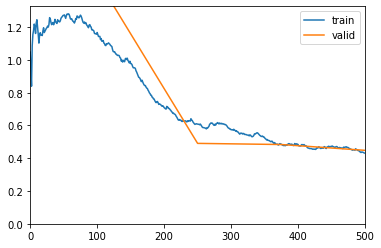

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.235156,0.442517,0.186667,0.813333,0.777778,00:07
1,0.132172,0.480167,0.193333,0.806667,0.742500,00:07
2,0.090479,0.498721,0.186667,0.813333,0.749722,00:07
3,0.353224,0.498606,0.193333,0.806667,0.737222,00:07
4,0.436306,0.458103,0.193333,0.806667,0.783889,00:07
5,0.421855,0.499395,0.200000,0.800000,0.742500,00:07
6,0.393666,0.430548,0.180000,0.820000,0.813611,00:07
7,0.399964,0.451651,0.166667,0.833333,0.791111,00:07
8,0.384434,0.455748,0.200000,0.800000,0.759167,00:07
9,0.369960,0.461616,0.180000,0.820000,0.762500,00:07


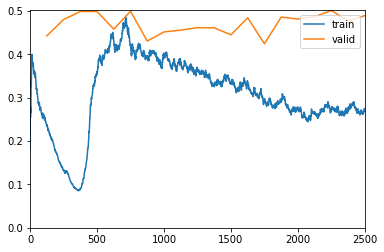

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,1.021928,0.739180,0.286667,0.713333,0.638611,00:05
1,0.627467,0.627588,0.226667,0.773333,0.647778,00:05
2,0.495590,0.514419,0.173333,0.826667,0.698056,00:05
3,0.441442,0.448625,0.180000,0.820000,0.765833,00:05


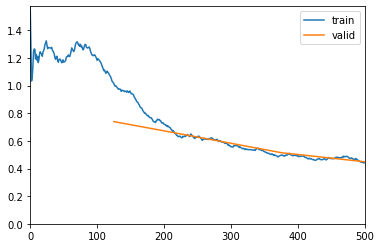

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.235561,0.464679,0.193333,0.806667,0.749444,00:07
1,0.133660,0.504352,0.180000,0.820000,0.766389,00:07
2,0.087860,0.533324,0.193333,0.806667,0.749722,00:07
3,0.382679,0.521120,0.173333,0.826667,0.765833,00:07
4,0.409716,0.420416,0.180000,0.820000,0.831944,00:07
5,0.420067,0.451396,0.160000,0.840000,0.781944,00:07
6,0.406450,0.482247,0.193333,0.806667,0.790278,00:07
7,0.392307,0.485850,0.206667,0.793333,0.765556,00:07
8,0.393152,0.460035,0.193333,0.806667,0.780556,00:07
9,0.356536,0.459103,0.186667,0.813333,0.808056,00:07


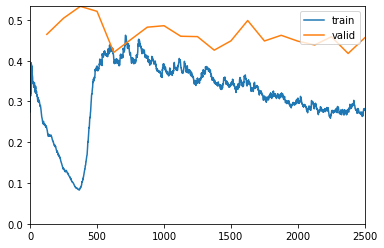

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,1.058463,0.833070,0.280000,0.720000,0.628333,00:05
1,0.638685,0.540589,0.240000,0.760000,0.705000,00:05
2,0.528534,0.476422,0.200000,0.800000,0.722778,00:05
3,0.449375,0.428371,0.186667,0.813333,0.795833,00:05


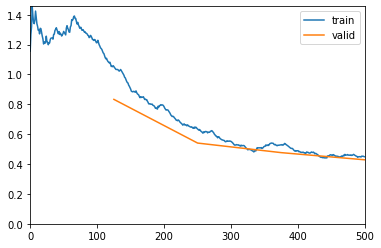

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.228942,0.438127,0.200000,0.800000,0.789167,00:07
1,0.138634,0.435153,0.193333,0.806667,0.788889,00:07
2,0.095324,0.492619,0.186667,0.813333,0.743611,00:07
3,0.400100,0.492571,0.180000,0.820000,0.777778,00:07
4,0.428628,0.423101,0.153333,0.846667,0.817778,00:07
5,0.409565,0.449833,0.146667,0.853333,0.778056,00:07
6,0.409229,0.497991,0.166667,0.833333,0.764722,00:07
7,0.398437,0.498561,0.186667,0.813333,0.756111,00:07
8,0.365900,0.419531,0.166667,0.833333,0.803889,00:07
9,0.345466,0.419632,0.173333,0.826667,0.823889,00:07


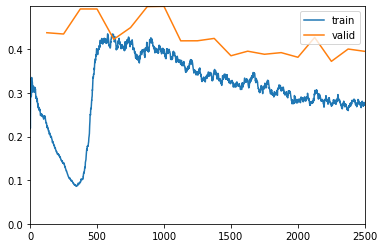

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,1.086742,0.964887,0.260000,0.740000,0.554167,00:05
1,0.645937,0.507399,0.206667,0.793333,0.727500,00:05
2,0.538520,0.550075,0.180000,0.820000,0.664444,00:05
3,0.450195,0.488046,0.193333,0.806667,0.720278,00:05


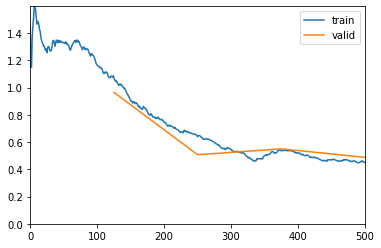

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.217175,0.492428,0.193333,0.806667,0.735555,00:07
1,0.149427,0.512176,0.180000,0.820000,0.730000,00:07
2,0.102962,0.620021,0.193333,0.806667,0.695278,00:07
3,0.389105,0.599141,0.193333,0.806667,0.704445,00:07
4,0.433086,0.471739,0.186667,0.813333,0.787222,00:07
5,0.399654,0.446133,0.180000,0.820000,0.801389,00:07
6,0.417007,0.387933,0.173333,0.826667,0.853611,00:07
7,0.377417,0.504125,0.200000,0.800000,0.786111,00:07
8,0.391920,0.488789,0.180000,0.820000,0.767222,00:07
9,0.342757,0.532769,0.173333,0.826667,0.797500,00:07


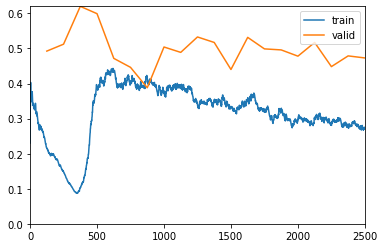

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.996160,0.780179,0.273333,0.726667,0.571944,00:05
1,0.643980,0.543808,0.193333,0.806667,0.622222,00:05
2,0.503821,0.501964,0.193333,0.806667,0.689167,00:05
3,0.432149,0.427205,0.160000,0.840000,0.784167,00:05


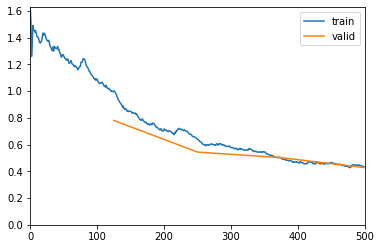

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.238327,0.449151,0.173333,0.826667,0.788056,00:07
1,0.136633,0.446546,0.173333,0.826667,0.786111,00:07
2,0.089274,0.460314,0.166667,0.833333,0.761389,00:07
3,0.372418,0.471609,0.166667,0.833333,0.789722,00:07
4,0.450958,0.455159,0.180000,0.820000,0.798055,00:07
5,0.440523,0.468301,0.160000,0.840000,0.810833,00:07
6,0.386219,0.411549,0.166667,0.833333,0.831667,00:07
7,0.394786,0.373279,0.173333,0.826667,0.855556,00:07
8,0.370844,0.407926,0.166667,0.833333,0.844167,00:07
9,0.370289,0.400584,0.153333,0.846667,0.830278,00:07


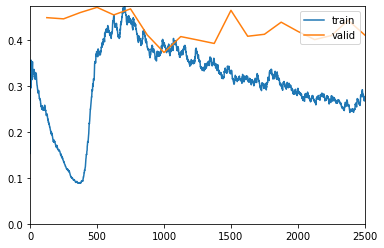

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,1.089054,0.739832,0.253333,0.746667,0.581944,00:05
1,0.643058,0.524424,0.213333,0.786667,0.690278,00:05
2,0.503123,0.504950,0.180000,0.820000,0.700278,00:05
3,0.434498,0.473606,0.173333,0.826667,0.763056,00:05


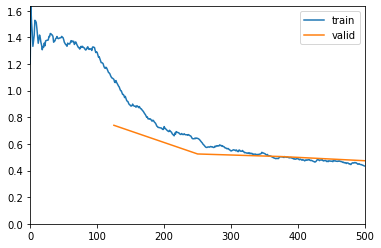

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.213643,0.496763,0.180000,0.820000,0.777500,00:07
1,0.129120,0.479217,0.180000,0.820000,0.775278,00:07
2,0.093777,0.515256,0.173333,0.826667,0.731945,00:07
3,0.370701,0.558441,0.193333,0.806667,0.727500,00:07
4,0.448067,0.505979,0.186667,0.813333,0.764444,00:07
5,0.412761,0.496763,0.200000,0.800000,0.771389,00:07
6,0.406788,0.458692,0.193333,0.806667,0.761945,00:07
7,0.403510,0.500823,0.193333,0.806667,0.765833,00:07
8,0.383194,0.512709,0.193333,0.806667,0.757500,00:07
9,0.369196,0.515345,0.193333,0.806667,0.785278,00:07


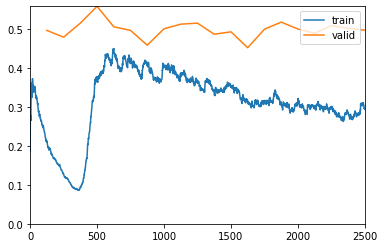

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,1.051325,0.633830,0.266667,0.733333,0.640278,00:05
1,0.611345,0.493836,0.213333,0.786667,0.758611,00:05
2,0.484214,0.501212,0.206667,0.793333,0.757500,00:05
3,0.487270,0.434815,0.173333,0.826667,0.777500,00:05


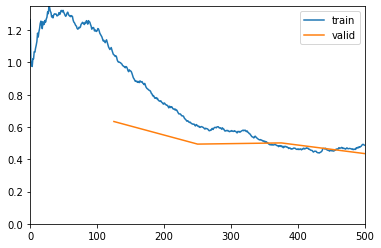

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.223798,0.436303,0.173333,0.826667,0.765833,00:07
1,0.130493,0.430326,0.180000,0.820000,0.808333,00:07
2,0.099520,0.499614,0.180000,0.820000,0.794444,00:07
3,0.410543,0.499181,0.173333,0.826667,0.744167,00:07
4,0.417943,0.463668,0.133333,0.866667,0.758611,00:07
5,0.429566,0.444291,0.160000,0.840000,0.783333,00:07
6,0.377398,0.485237,0.166667,0.833333,0.766944,00:07
7,0.379430,0.459480,0.160000,0.840000,0.772222,00:07
8,0.371597,0.450443,0.186667,0.813333,0.789445,00:07
9,0.357066,0.437193,0.160000,0.840000,0.806111,00:07


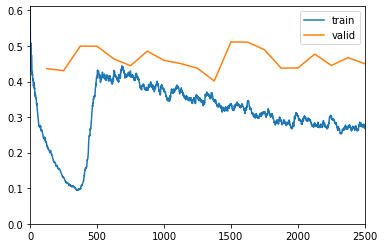

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,1.041271,0.652232,0.240000,0.760000,0.697500,00:05
1,0.638132,0.447663,0.173333,0.826667,0.756944,00:05
2,0.488015,0.489843,0.186667,0.813333,0.775556,00:05
3,0.463026,0.465917,0.186667,0.813333,0.774167,00:05


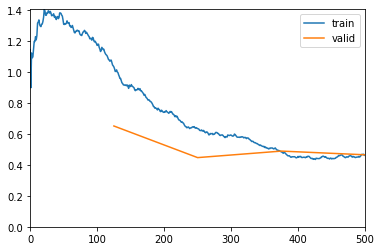

epoch,train_loss,valid_loss,error_rate,accuracy,auroc,time
0,0.222856,0.458817,0.186667,0.813333,0.772778,00:07
1,0.133325,0.520996,0.180000,0.820000,0.767500,00:07
2,0.091935,0.593068,0.200000,0.800000,0.756111,00:07
3,0.399920,0.567054,0.186667,0.813333,0.806111,00:07
4,0.427116,0.473933,0.186667,0.813333,0.788333,00:07
5,0.430278,0.486718,0.186667,0.813333,0.811389,00:07


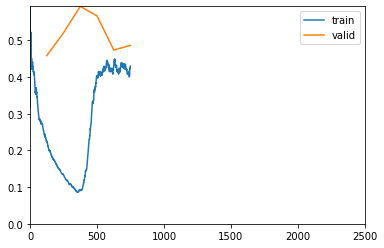

KeyboardInterrupt: 

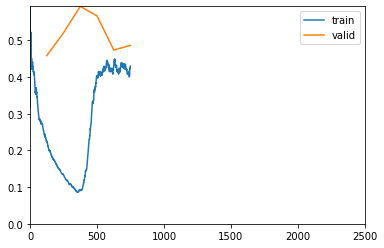

In [37]:
seeds = [1,2,3,4,5,6,7,8,9,10]
epochs = 20

for seed in seeds:
    data = reload_dataset(dm,seed)    
    random_seed(seed,True)
    
    #No color correction
    learn = simple_train(data,seed,epochs)

    
    #Con color correction
    data = reload_dataset(dm,seed)
    color_constancy_tfm = correct_color_shades_of_gray(p=6 ,gamma=1/2.2, order=0)
    data.train_ds.tfms.insert(0,color_constancy_tfm);
    data.valid_ds.tfms.insert(0,color_constancy_tfm);

    
    learn_color_correction = simple_train(data,seed,epochs)
    
    write_results(seed, learn, learn_color_correction)
    